In [1]:
import math
import numpy as np
import sys
import os
import uproot
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from scipy import stats, optimize
import pylandau
from pathlib import Path

findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


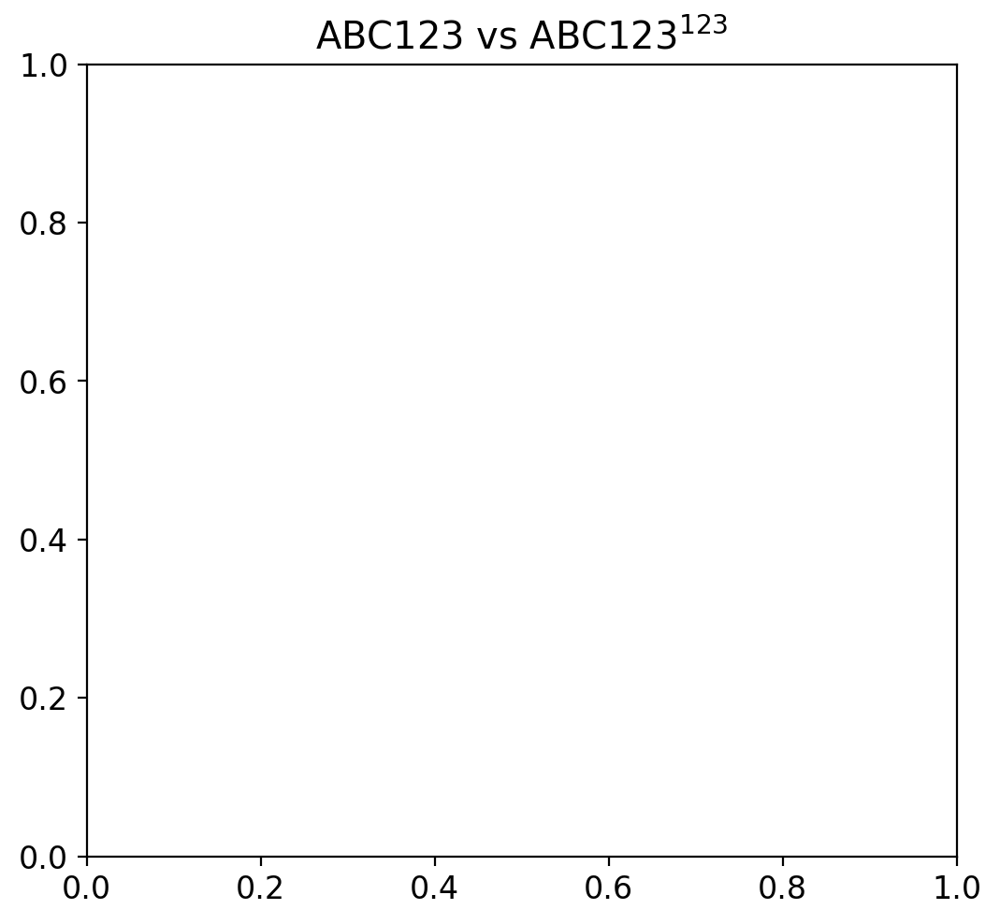

In [2]:
from CRVclasses import *

In [3]:
# from funs import *

plt.rcParams["font.size"]=12
plt.rcParams["axes.labelsize"]=12
plt.rcParams["figure.dpi"]=200
plt.rcParams['figure.figsize'] = [6, 5.5]

In [4]:
%%capture

matplotlib.rcParams['mathtext.fontset'] = 'custom'
matplotlib.rcParams['mathtext.rm'] = 'Bitstream Vera Sans'
matplotlib.rcParams['mathtext.it'] = 'Bitstream Vera Sans:italic'
matplotlib.rcParams['mathtext.bf'] = 'Bitstream Vera Sans:bold'
matplotlib.pyplot.title(r'ABC123 vs $\mathrm{ABC123}^{123}$')

matplotlib.rcParams['mathtext.fontset'] = 'stix'
matplotlib.rcParams['font.family'] = 'STIXGeneral'
matplotlib.pyplot.title(r'ABC123 vs $\mathrm{ABC123}^{123}$')

In [5]:
frontcrv0 = CRVHitMap("../Root_outputs/CRVAnalysis.root")

In [6]:
frontcrv0.getGeometry(geo_type='grid', nstrips=43)
frontcrv0.getHitsPerChannel()

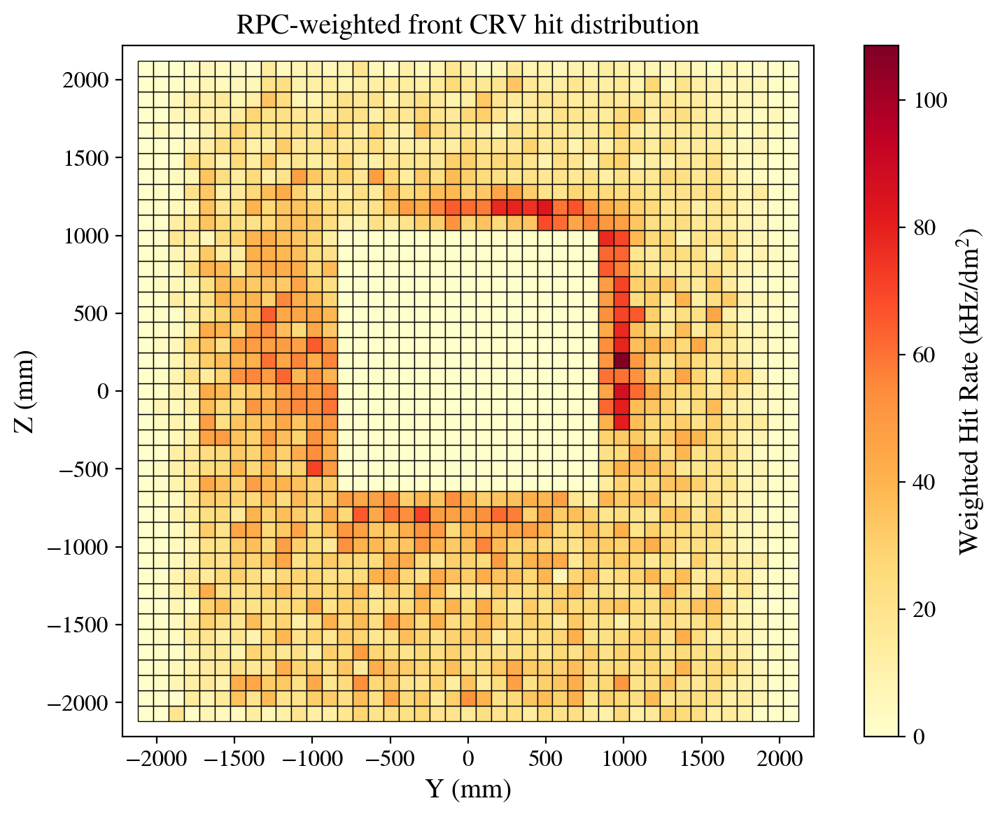

In [7]:
plot_grid_hitmap(frontcrv0, plotHits=False)

In [8]:
## 1 kHz/dm2 = 1000/100 Hz/cm2 = 10 Hz/cm2 

In [9]:
np.corrcoef(frontcrv0.HitT, frontcrv0.HitX), np.corrcoef(frontcrv0.HitT, frontcrv0.HitY), np.corrcoef(frontcrv0.HitT, frontcrv0.HitZ)

(array([[ 1.        , -0.00787421],
        [-0.00787421,  1.        ]]),
 array([[ 1.        , -0.06577853],
        [-0.06577853,  1.        ]]),
 array([[ 1.       , -0.0587527],
        [-0.0587527,  1.       ]]))

In [10]:
def xBins(bins):
    return np.array([ (bins[i]+bins[i+1])/2 for i in range(len(bins)-1) ])

def getPDFfromDist(t_arr, nbins):
    pdf_t, bins_t = np.histogram(t_arr, nbins, density=True)
    xbins_t = xBins(bins_t)
    return pdf_t, xbins_t

def invCDFGen(cdf, xbins, nsamples):
    # draw y-value from uniform distribution
    u_arr = np.random.uniform(0, 1, nsamples)
    # find cdf point index of y-value
    indices = np.searchsorted(cdf, u_arr)
    # get x-value (x_i = F-1(y_i))
    x_dist = xbins[indices]
    return x_dist

def generateFromDist(t_arr, nbins, nsamples):
    pdf_t, xbins_t = getPDFfromDist(t_arr, nbins)
    norm = np.sum(pdf_t)
    print("pdf norm = {:.2e}".format(norm))
    cdf_t = np.cumsum(pdf_t) / norm
    t_dist = invCDFGen(cdf_t, xbins_t, nsamples)
    return t_dist

def getPDFfromDist_2D(x_data, y_data, nbins):
    hist2d, x_edges, y_edges = np.histogram2d(x_data, y_data, bins=nbins, density=True)
    xbins, ybins = xBins(x_edges), xBins(y_edges)
    return hist2d, xbins, ybins

def invCDFGen_2D(cdf, tbins, sbins, nsamples, twoDshape):
    # draw y-value from uniform distribution
    u_arr = np.random.uniform(0, 1, nsamples)
    # find cdf point index of y-value
    indices = np.searchsorted(cdf, u_arr)
    # convert flat indices to 2D bin indices
    t_idx, s_idx = np.unravel_index(indices, twoDshape) 
    # get x-value (x_i = F-1(y_i))
    t_dist = tbins[t_idx]
    s_dist = sbins[s_idx]
    return t_dist, s_dist

def generateFromDist_2D(x_data, y_data, nbins, nsamples):
    hist2d, xbins, ybins = getPDFfromDist_2D(x_data, y_data, nbins)
    pdf = hist2d.flatten()
    norm = np.sum(pdf)
    print("pdf norm = {:.2e}".format(norm))
    cdf = np.cumsum(pdf) / norm
    x_dist, y_dist = invCDFGen_2D(cdf, xbins, ybins, nsamples, hist2d.shape)
    return x_dist, y_dist

def getPDFfromDist_3D(t_data, x_data, y_data, nbinst, nbinsxy):
    hist3d, edges = np.histogramdd([t_data, x_data, y_data], np.array([nbinst, nbinsxy, nbinsxy]), density=True)
    t_edges, x_edges, y_edges = edges
    tbins, xbins, ybins = xBins(t_edges), xBins(x_edges), xBins(y_edges)
    return hist3d, tbins, xbins, ybins

def invCDFGen_3D(cdf, tbins, sbins, rbins, nsamples, twoDshape):
    # draw y-value from uniform distribution
    u_arr = np.random.uniform(0, 1, nsamples)
    # find cdf point index of y-value
    indices = np.searchsorted(cdf, u_arr)
    # convert flat indices to 2D bin indices
    t_idx, s_idx, r_idx = np.unravel_index(indices, twoDshape) 
    # get x-value (x_i = F-1(y_i))
    t_dist = tbins[t_idx]
    s_dist = sbins[s_idx]
    r_dist = rbins[r_idx]
    return t_dist, s_dist, r_dist

def generateFromDist_3D(t_data, x_data, y_data, nbinst, nbinsxy, nsamples):
    hist3d, tbins, xbins, ybins = getPDFfromDist_3D(t_data, x_data, y_data, nbinst, nbinsxy)
    pdf = hist3d.flatten()
    norm = np.sum(pdf)
    print("pdf norm = {:.2e}".format(norm))
    cdf = np.cumsum(pdf) / norm
    t_dist, x_dist, y_dist = invCDFGen_3D(cdf, tbins, xbins, ybins, nsamples, hist3d.shape)
    return t_dist, x_dist, y_dist

In [11]:
### For a 1e6 ns total duration (1e3*1e3 n_bunches * bunch_DT)
### and 1.63e7 POTs / bunch
### nbins = 1e6 (1 bin per ns)
### nsamples = 1.63e10 (1.63e7*1e3 (POTs/bunch)*n_bunches)

nbins = int(1e6) 
# nsamples = int(2*1e7)
nsamples = int(1e6)

tmod = frontcrv0.HitT[frontcrv0.HitT<=1e6]
print(len(tmod/1e3), len(frontcrv0.HitT/1e3))

pdf_t, xbins_t = getPDFfromDist(tmod, nbins)

160965 163669


In [12]:
t_gen = generateFromDist(tmod, nbins, nsamples)

pdf norm = 1.00e+00


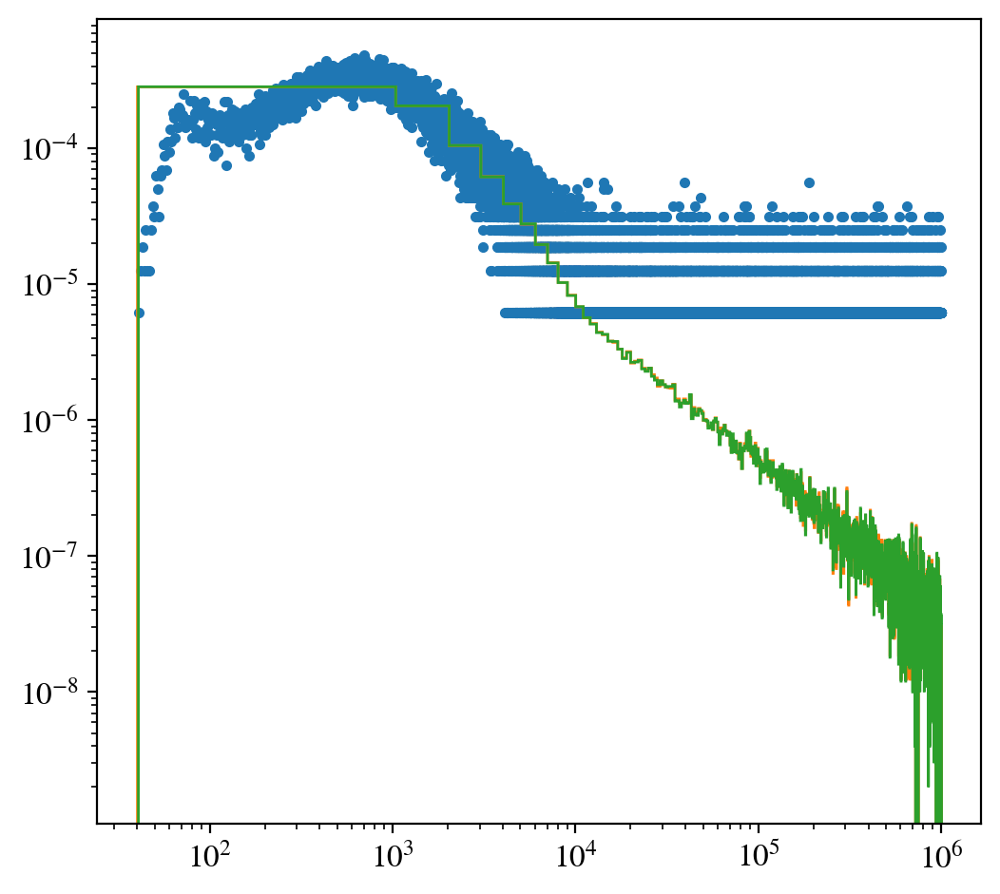

In [13]:

plt.plot(xbins_t, pdf_t, '.')
plt.hist(tmod, 1000, density=True, histtype='step')
plt.hist(t_gen, 1000, density=True, histtype='step')
plt.yscale('log')
# plt.xlim(0, 1e3)
plt.xscale('log')

In [14]:
nPOT = 99995000 
nPOTperBunch = int(1.63e7)
DT = 1316 ## ns, bunch interval
dT = 100 ## ns, pulse duration
nBunches = 1000

# Tmax = int(nBunches*DT)
nHits = len(frontcrv0.HitT)
nHitsPerPOT = nHits/nPOT
nHitsPerBunch = int(nHitsPerPOT*nPOTperBunch)
print(nHits, nHitsPerPOT, nHitsPerBunch)

163669 0.0016367718385919296 26679


In [15]:
### For a 1e6 ns total duration (1e3*1e3 n_bunches * bunch_DT)
### and 1.63e7 POTs / bunch
### nbins = 1e6 (1 bin per ns)
### nsamples = 1.63e10 (1.63e7*1e3 (POTs/bunch)*n_bunches)

nbins = int(1e6) 
nsamples = int(nHitsPerBunch*nBunches)
print(nsamples)

tmod = frontcrv0.HitT[frontcrv0.HitT<=1e6]
print(len(tmod/1e3), len(frontcrv0.HitT/1e3))

pdf_t, xbins_t = getPDFfromDist(tmod, nbins)
t_gen = generateFromDist(tmod, nbins, nsamples)

26679000
160965 163669
pdf norm = 1.00e+00


In [16]:
# bunchT = np.array([np.linspace(ibunch*DT, ibunch*DT + dT, nHitsPerBunch) for ibunch in range(nBunches)])
bunchT = np.array([np.random.uniform(ibunch*DT, ibunch*DT + dT, nHitsPerBunch) for ibunch in range(nBunches)])
bunchT_flat = bunchT.flatten()

len(bunchT_flat), len(t_gen), bunchT_flat[:3]

(26679000, 26679000, array([29.86326362, 20.37915713, 76.09757115]))

In [17]:
### real time distribution (thit) over nBunches bunches
### = uniform distribution of POT t0 + custom distribution of thit-t0 

t_dist_real = bunchT_flat + t_gen

In [18]:
np.max(bunchT_flat)/1e6

1.3147839966644994

Text(0.5, 0, 'time (ns)')

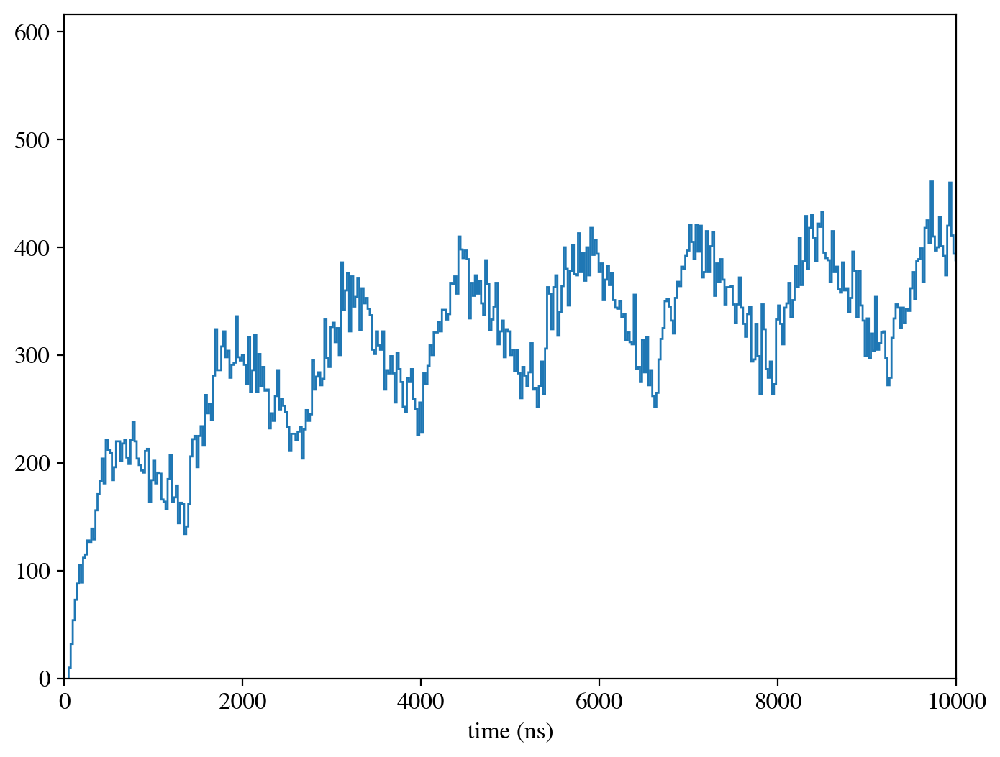

In [19]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.hist(t_dist_real, int(1e5), histtype='step')
## show 3 bunches
# ax.set_xlim(0, int(3*DT))
ax.set_xlim(0, int(1e4))
ax.set_xlabel("time (ns)")

Text(0.5, 0, 'time (ns)')

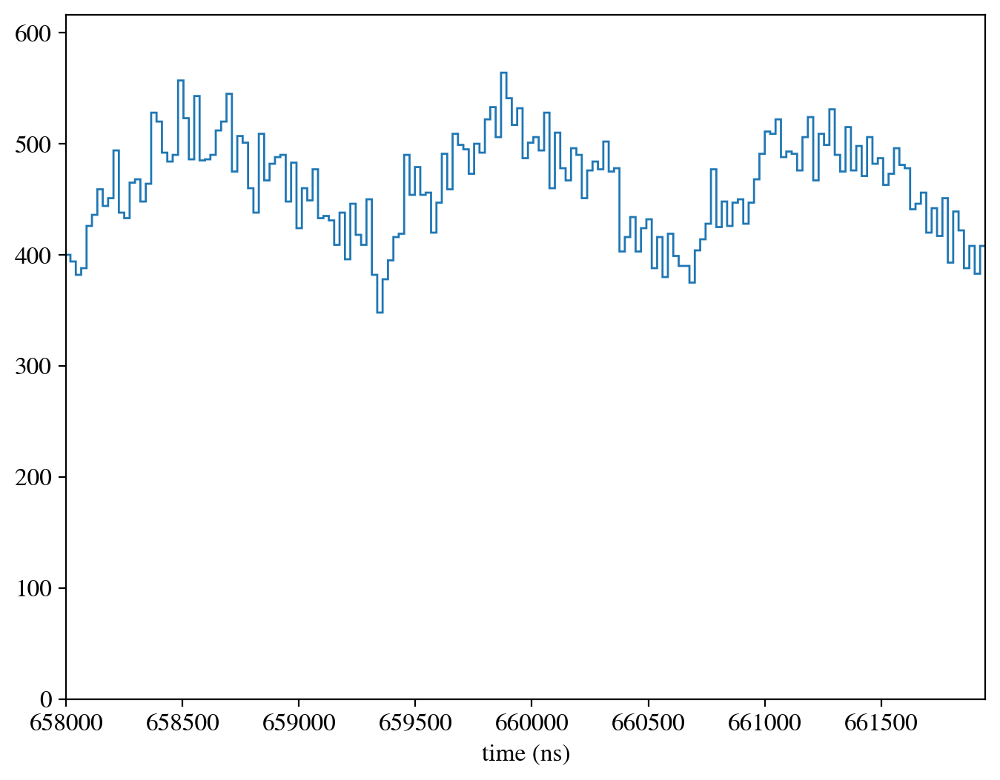

In [20]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.hist(t_dist_real, int(1e5), histtype='step')
## show 3 bunches
# ax.set_xlim(0, int(3*DT))
ax.set_xlim(int(500*DT), int(503*DT))
ax.set_xlabel("time (ns)")

In [21]:
nbins = int(1e4)
nsamples = int(1e6)
# nsamples = int(nHitsPerBunch*nBunches)

xmod = frontcrv0.HitY[frontcrv0.HitT<=2e6]
ymod = frontcrv0.HitZ[frontcrv0.HitT<=2e6]

hist2d, xbins, ybins = getPDFfromDist_2D(xmod, ymod, nbins)
x_dist, y_dist = generateFromDist_2D(xmod, ymod, nbins, nsamples)

pdf norm = 6.18e+00


(array([-923.53976698,  917.40221183]),
 array([-722.75, 1135.75]),
 -3.0687775778600894,
 206.49999999999346,
 1840.9419788122018,
 1858.5)

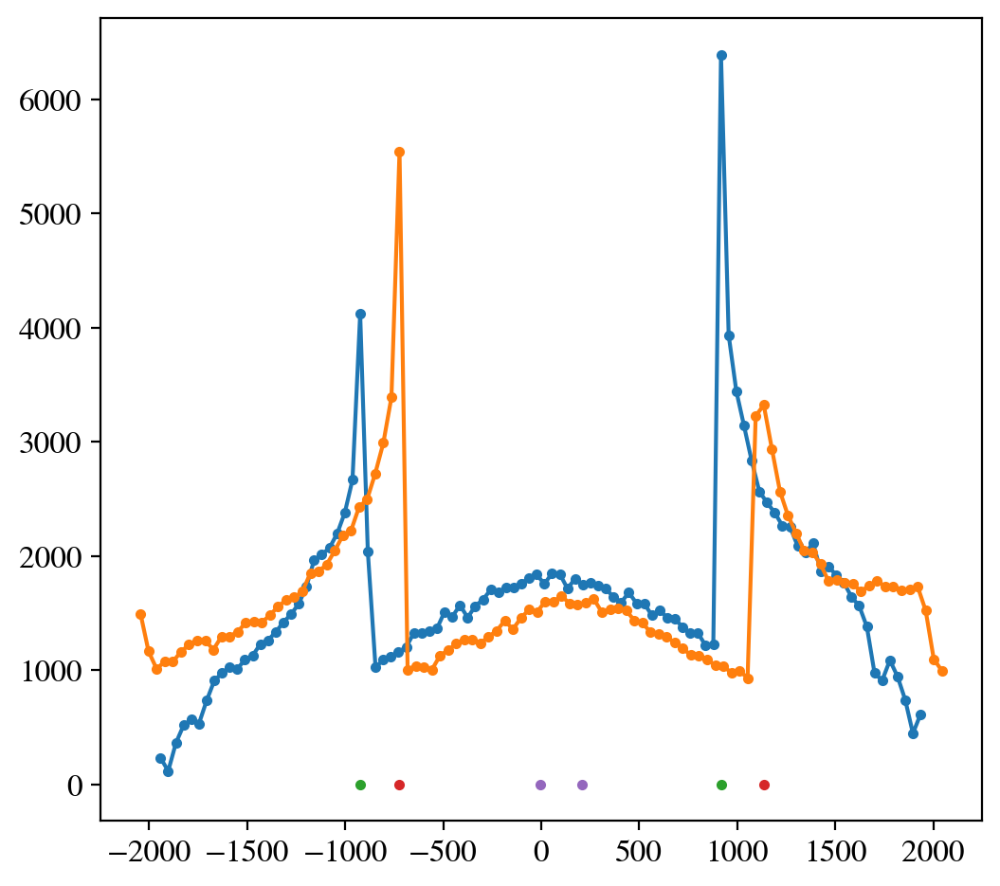

In [22]:
nbins = 100

yhist, ybins = np.histogram(xmod, nbins)
ybins = xBins(ybins)
zhist, zbins = np.histogram(ymod, nbins)
zbins = xBins(zbins)

iywin = [np.argmax(yhist[:nbins//2]), nbins//2 + np.argmax(yhist[nbins//2:])]
izwin = [np.argmax(zhist[:nbins//2]), nbins//2 + np.argmax(zhist[nbins//2:])]

ywin = ybins[iywin]
zwin = zbins[izwin]
ycenter = (ywin[0]+ywin[1])/2
zcenter = (zwin[0]+zwin[1])/2

ywinWidth = ywin[1]-ywin[0]
zwinWidth = zwin[1]-zwin[0]

plt.plot(ybins, yhist, '.-')
plt.plot(zbins, zhist, '.-')
plt.plot(ywin, [0, 0], '.')
plt.plot(zwin, [0, 0], '.')
plt.plot([ycenter, zcenter], [0, 0], '.')

ywin, zwin, ycenter, zcenter, ywinWidth, zwinWidth

In [166]:
ywinWidth, ywinWidth/(1+np.sqrt(2))

(1840.9419788122018, 762.543135165977)

In [165]:
762 + 2*(762/np.sqrt(2))

1839.6307345282983

In [23]:
# 11: electron
# 13: muon
# 22: photon
# 2112: neutron
# 2212: proton
# 1000010020: deuterium

In [24]:
def getCenterHits(ymin, ymax, zmin, zmax, particle=None):

    HitT = frontcrv0.HitT
    HitX = frontcrv0.HitX
    HitY = frontcrv0.HitY
    HitZ = frontcrv0.HitZ
    IsFirstHit = frontcrv0.IsFirstHit
    PID = frontcrv0.treeFront_arr.PID[IsFirstHit==True]
    # Rho = np.sqrt(HitY**2 + HitZ**2)

    if particle=='neutrons':
        ymod = HitY[(HitT<=2e6) & (HitY>=ymin) & (HitY<=ymax) & (HitZ>=zmin) & (HitZ<=zmax) & (PID==2112)]
        zmod = HitZ[(HitT<=2e6) & (HitY>=ymin) & (HitY<=ymax) & (HitZ>=zmin) & (HitZ<=zmax) & (PID==2112)]
    elif particle=='gamma':
        ymod = HitY[(HitT<=2e6) & (HitY>=ymin) & (HitY<=ymax) & (HitZ>=zmin) & (HitZ<=zmax) & (PID==22)]
        zmod = HitZ[(HitT<=2e6) & (HitY>=ymin) & (HitY<=ymax) & (HitZ>=zmin) & (HitZ<=zmax) & (PID==22)]
    else:
        ymod = HitY[(HitT<=2e6) & (HitY>=ymin) & (HitY<=ymax) & (HitZ>=zmin) & (HitZ<=zmax)]
        zmod = HitZ[(HitT<=2e6) & (HitY>=ymin) & (HitY<=ymax) & (HitZ>=zmin) & (HitZ<=zmax)]

    return ymod, zmod


def getCenterHits_2(rhomax, yoff, zoff, particle=None):

    HitT = frontcrv0.HitT
    HitX = frontcrv0.HitX
    HitY = frontcrv0.HitY - yoff
    HitZ = frontcrv0.HitZ - zoff
    IsFirstHit = frontcrv0.IsFirstHit
    PID = frontcrv0.treeFront_arr.PID[IsFirstHit==True]
    Rho = np.sqrt(HitY**2 + HitZ**2)

    if particle=='neutrons':
        ymod = HitY[(HitT<=2e6) & (Rho<=rhomax) & (PID==2112)]
        zmod = HitZ[(HitT<=2e6) & (Rho<=rhomax) & (PID==2112)]
    elif particle=='gamma':
        ymod = HitY[(HitT<=2e6) & (Rho<=rhomax) & (PID==22)]
        zmod = HitZ[(HitT<=2e6) & (Rho<=rhomax) & (PID==22)]
    else:
        ymod = HitY[(HitT<=2e6) & (Rho<=rhomax)]
        zmod = HitZ[(HitT<=2e6) & (Rho<=rhomax)]

    return ymod, zmod

In [25]:
octoStripWidth = 370
yoff = 0
zoff = 200
# yabs = zwinWidth/2 + octoStripWidth
yabs = 1200
print(yabs)
rhomax = 950

ymin, ymax = -yabs + yoff, yabs + yoff
zmin, zmax = -yabs + zoff, yabs + zoff

y_neu, z_neu = getCenterHits(ymin, ymax, zmin, zmax, 'neutrons')
y_pho, z_pho = getCenterHits(ymin, ymax, zmin, zmax, 'gamma')
y_all, z_all = getCenterHits(ymin, ymax, zmin, zmax)

y_neu, z_neu = y_neu - yoff, z_neu - zoff
y_pho, z_pho = y_pho - yoff, z_pho - zoff
y_all, z_all = y_all - yoff, z_all - zoff

len(y_neu), len(y_pho), len(y_all)

1200


(53677, 12451, 66473)

In [26]:
y_neu_rho, z_neu_rho = getCenterHits_2(rhomax, yoff, zoff, 'neutrons')
y_pho_rho, z_pho_rho = getCenterHits_2(rhomax, yoff, zoff, 'gamma')
y_all_rho, z_all_rho = getCenterHits_2(rhomax, yoff, zoff)

96.45036386516294 -43.79439761873482


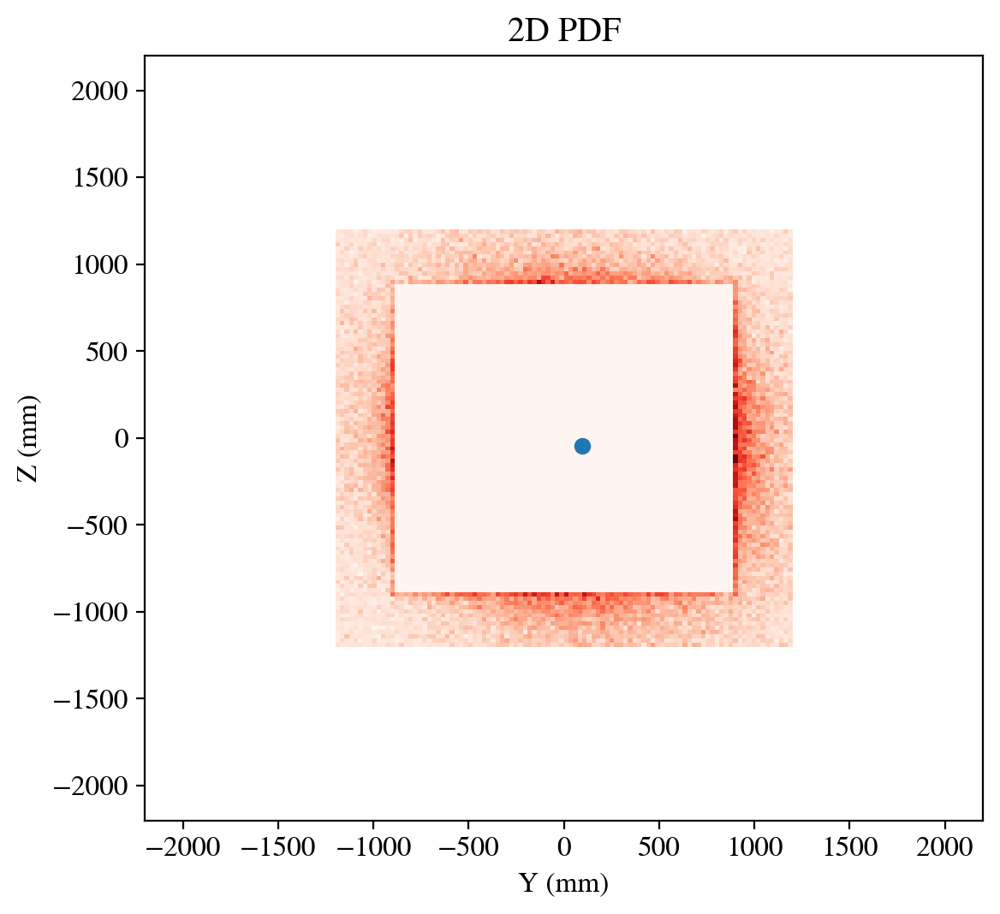

In [27]:
nbins = 100
# norm = mcolors.Normalize(vmin=0, vmax=pdf.max())
# norm = mcolors.LogNorm(vmin=, vmax=pdf.max())
# Call your function
# pdf, xcenters, ycenters = getPDFfromDist_2D(x_data, y_data, nbins=1000)

# pdf, x_edges, y_edges = np.histogram2d(y_pho, z_pho, 100)
# pdf, x_edges, y_edges = np.histogram2d(y_neu, z_neu, 100)
pdf, x_edges, y_edges = np.histogram2d(y_all, z_all, 100)
# pdf, x_edges, y_edges = np.histogram2d(y_all_rho, z_all_rho, 100)

y0_beam, z0_beam = np.mean(y_all), np.mean(z_all)

# Create meshgrid for pcolormesh
X, Y = np.meshgrid(x_edges, y_edges)

# Plot
plt.figure(figsize=(6, 5.5))
# pcm = plt.pcolormesh(X, Y, pdf.T, cmap='Reds', shading='auto')  # note: transpose
# plt.hist2d(y_all_rho, z_all_rho, 100, cmap="Reds")
plt.hist2d(y_all, z_all, nbins, cmap="Reds")
plt.plot(y0_beam, z0_beam, 'o', c='tab:blue')
print(y0_beam, z0_beam)
plt.xlabel("Y (mm)")
plt.ylabel("Z (mm)")
plt.title("2D PDF")
# plt.colorbar(pcm, label='Probability Density')
plt.tight_layout()

plt.xlim(-2200, 2200)
plt.ylim(-2200, 2200)
plt.show()


In [28]:
len(y_all), len(z_all)

(66473, 66473)

In [29]:
# y_all2 = generateFromDist(y_all-yoff, 1000, 100000)
# z_all2 = generateFromDist(z_all-zoff, 1000, 100000)
y_all2 = generateFromDist(y_all, 1000, len(y_all))
z_all2 = generateFromDist(z_all, 1000, len(y_all))

pdf norm = 4.17e-01
pdf norm = 4.17e-01


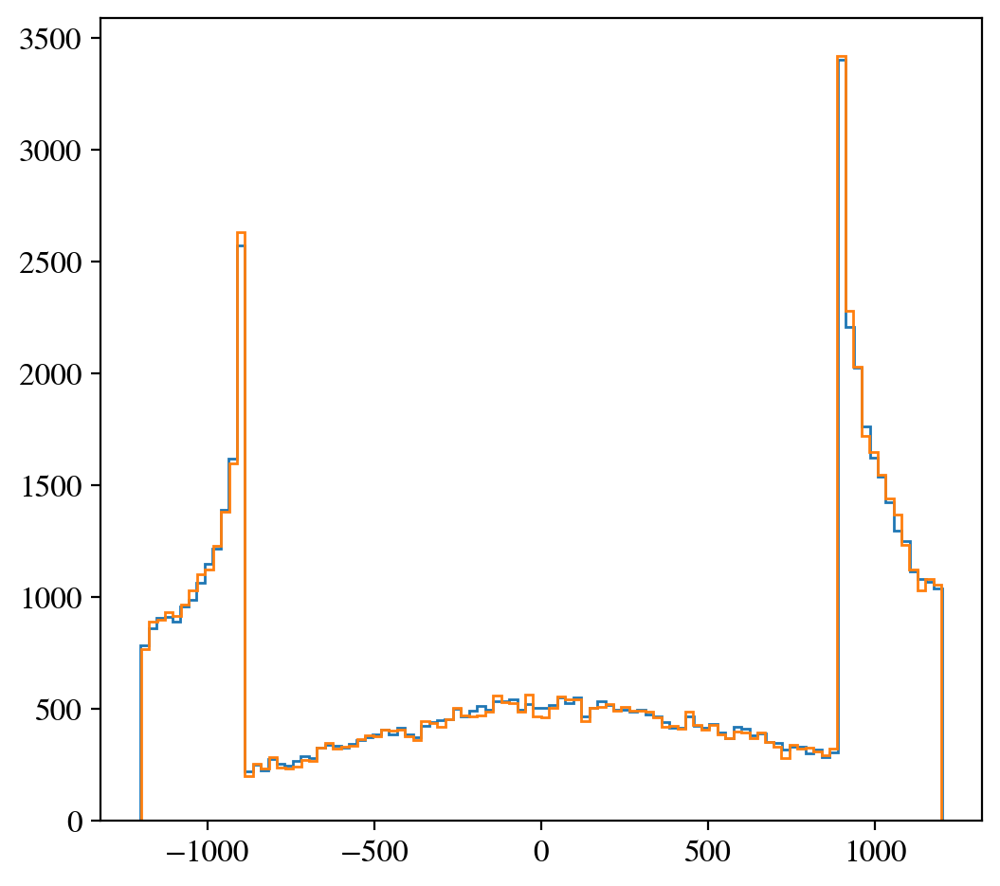

In [30]:
plt.hist(y_all, 100, histtype='step')
plt.hist(y_all2, 100, histtype='step')
# plt.hist(z_all, 100, histtype='step')
# plt.hist(z_all2, 100, histtype='step')
plt.show()

In [31]:
### polar coordonitate in beam frame
# rho = np.sqrt((y_all-y0_beam)**2 + (z_all-z0_beam)**2)
# phi = np.arctan2(z_all-z0_beam, y_all-y0_beam)

rho = np.sqrt(y_all**2 + z_all**2)
phi = np.arctan2(z_all, y_all)
print(len(phi))

rho_neu = np.sqrt(y_neu**2 + z_neu**2)
phi_neu = np.arctan2(z_neu, y_neu)

rho_pho = np.sqrt(y_pho**2 + z_pho**2)
phi_pho = np.arctan2(z_pho, y_pho)

# rho = np.sqrt(y_all_rho**2 + z_all_rho**2)
# phi = np.arctan2(z_all_rho, y_all_rho)

phi_new = generateFromDist(phi, 1000, len(phi))
rho_new = generateFromDist(rho, 1000, len(phi))

print("")

66473
pdf norm = 1.59e+02
pdf norm = 1.26e+00



In [32]:
ll = [2, 3, 4]
ll.extend([6, 7])
ll

[2, 3, 4, 6, 7]

In [33]:
def square_ring_mask(x, y, D):
    R = D / 2
    inside_square = (np.abs(x) <= R) & (np.abs(y) <= R)
    outside_circle = (x**2 + y**2) >= R**2
    return inside_square & outside_circle

def square_frame_mask(x, y, l, L):
    d1 = l/2
    d2 = L/2
    toporbot = (np.abs(x)<d2) & (np.abs(y)<d2) & (np.abs(y)>=d1)
    leftorright = (np.abs(y)<d2) & (np.abs(x)<d2) & (np.abs(x)>=d1)
    return toporbot | leftorright

def generateFromDist_2D_masked(x_data, y_data, nbins, nsamples, l, L):
    """
    mask_fn: function that takes (x, y) arrays and returns a boolean mask of valid points
    """
    hist2d, xbins, ybins = getPDFfromDist_2D(x_data, y_data, nbins)
    pdf = hist2d.flatten()
    norm = np.sum(pdf)
    print("pdf norm = {:.2e}".format(norm))
    cdf = np.cumsum(pdf) / norm

    ring_x = []
    ring_y = []
    frame_x = []
    frame_y = []

    batch_size = nsamples  # Sample in chunks
    while len(frame_x) < nsamples:
        x_try, y_try = invCDFGen_2D(cdf, xbins, ybins, batch_size, hist2d.shape)
        frame_mask = square_frame_mask(x_try, y_try, l, L)
        ring_mask = square_ring_mask(x_try, y_try, l)
        ring_x.extend(x_try[ring_mask])
        ring_y.extend(y_try[ring_mask])
        frame_x.extend(x_try[frame_mask])
        frame_y.extend(y_try[frame_mask])
    n_frame = len(frame_x)
    n_ring = len(ring_x)
    print(nsamples)
    print(n_frame)
    print(n_ring)
    if n_frame>nsamples:
        frameRingRatio = n_ring/n_frame
        nsamples_ring = int(frameRingRatio*nsamples)
        print(nsamples_ring)
        frame_x, frame_y = np.array(frame_x[:nsamples]), np.array(frame_y[:nsamples])
        ring_x, ring_y = np.array(ring_x[:nsamples_ring]), np.array(ring_y[:nsamples_ring])
    return ring_x, ring_y, frame_x, frame_y



In [34]:
square_ring_mask(np.array([0, 4]), np.array([0, 4]), 10)

array([False,  True])

pdf norm = 1.59e+02
pdf norm = 1.26e+00
n_square_frame = 66352
pdf norm = 8.89e-02
66352
79933
31074
25794
n_ring_frame = 25794
n_square_frame = 66352


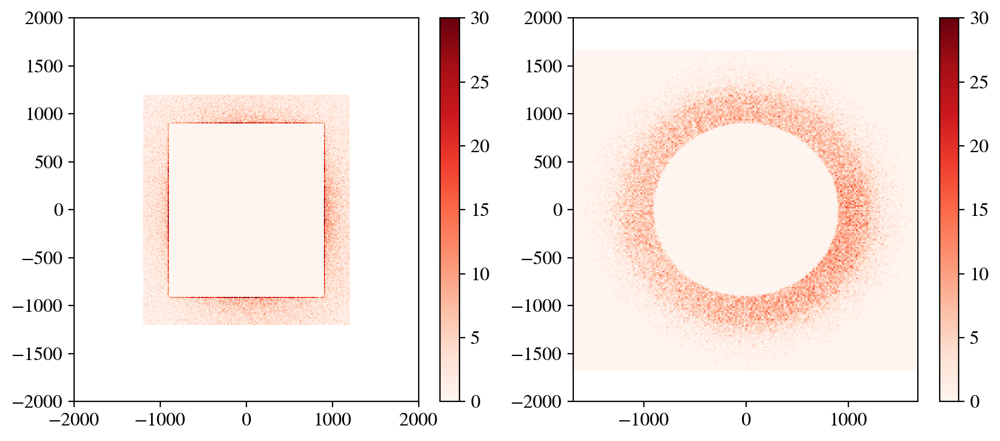

In [35]:
yoff = -3
zoff = 206
nbins = 1000 # for inverse transform sampling
l = 1800
L = 2400
norm = mcolors.Normalize(vmin=0, vmax=30)

yabs = L//2
ymin, ymax = -yabs + yoff, yabs + yoff
zmin, zmax = -yabs + zoff, yabs + zoff

## get hits inside square frame in centered cartesian frame
y_all, z_all = getCenterHits(ymin, ymax, zmin, zmax)
y_all, z_all = y_all - yoff, z_all - zoff

## 1D radial generation
nsamples = len(y_all)
rho = np.sqrt(y_all**2 + z_all**2)
phi = np.arctan2(z_all, y_all)
phi_new = generateFromDist(phi, nbins, nsamples)
rho_new = generateFromDist(rho, nbins, nsamples)

## y,z from radial generation
y_new = rho_new*np.cos(phi_new)
z_new = rho_new*np.sin(phi_new)

fig, axs = plt.subplots(1, 2, tight_layout=True, figsize=(9,4))
hist = axs[0].hist2d(y_all, z_all, 200, cmap='Reds', shading='auto', alpha=1, norm=norm)
hist2 = axs[1].hist2d(y_new, z_new, 200, cmap='Reds', shading='auto', alpha=1, norm=norm)
axs[0].set_xlim(-2000, 2000)
axs[0].set_ylim(-2000, 2000)
axs[1].set_ylim(-2000, 2000)
axs[1].set_ylim(-2000, 2000)
plt.colorbar(hist[3], ax=axs[0])
plt.colorbar(hist2[3], ax=axs[1])


print("n_square_frame = {}".format(nsamples))
y_ring, z_ring, y_frame, z_frame = generateFromDist_2D_masked(y_new, z_new, nbins, nsamples, l, L)
print("n_ring_frame = {}".format(len(y_ring)))
print("n_square_frame = {}".format(len(y_frame)))

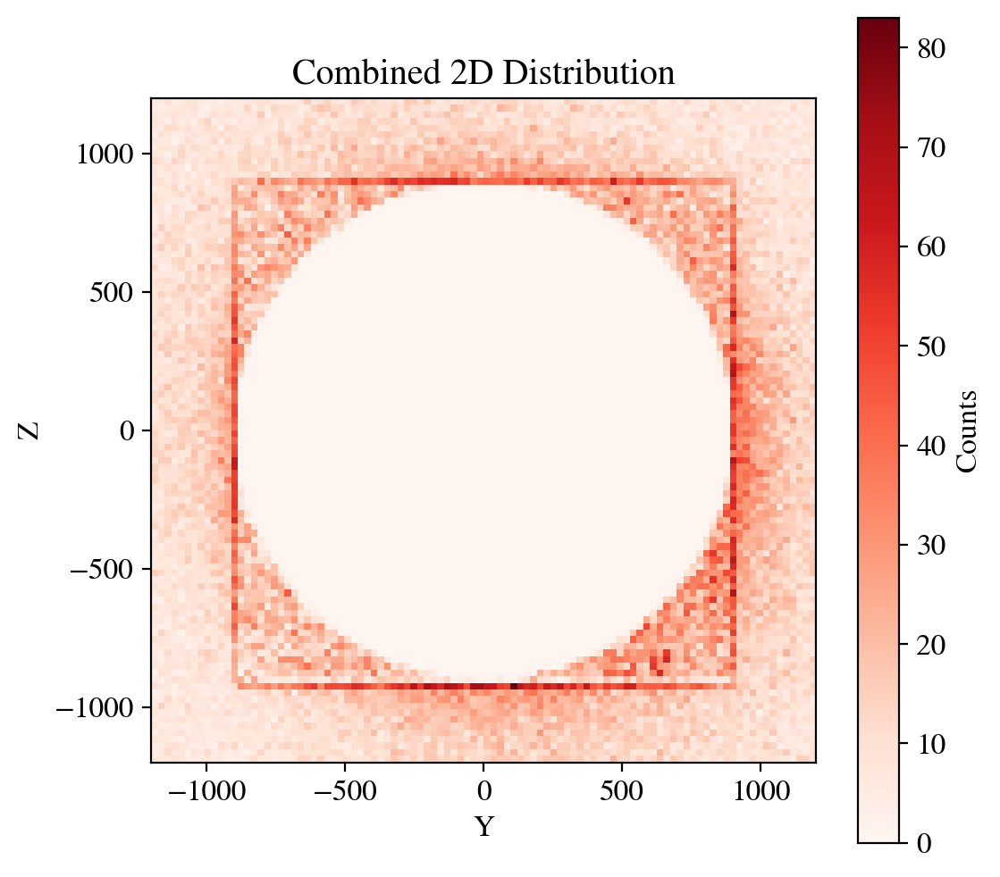

In [36]:
# Combine data
y_combined = np.concatenate([y_all, y_ring])
z_combined = np.concatenate([z_all, z_ring])
# y_combined = np.concatenate([y_all])
# z_combined = np.concatenate([z_all])

# Plot combined distribution
plt.figure(figsize=(6, 6))
plt.hist2d(y_combined, z_combined, bins=100, cmap="Reds")
# plt.hist2d(y_frame, z_frame, bins=100, cmap="Reds")
plt.gca().set_aspect("equal")
plt.xlabel("Y")
plt.ylabel("Z")
plt.title("Combined 2D Distribution")
plt.colorbar(label="Counts")
plt.show()


(-2000.0, 2000.0)

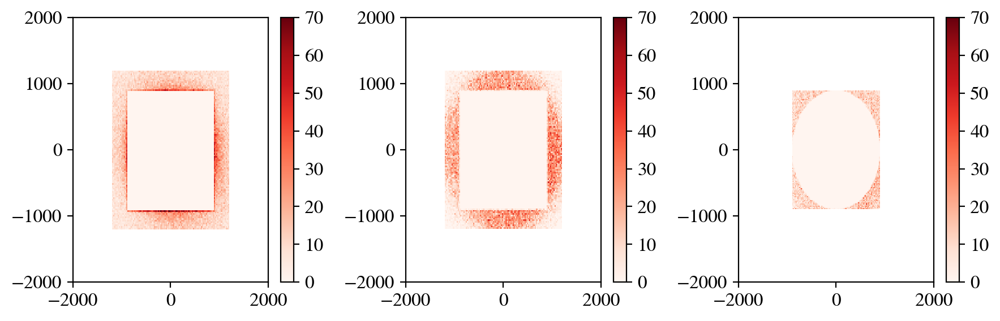

In [37]:
vmin, vmax = 0, 70
norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

fig, axs = plt.subplots(1, 3, tight_layout=True, figsize=(9,3))

hist = axs[0].hist2d(y_all, z_all, 100, cmap='Reds', shading='auto', alpha=1, norm=norm)
hist2 = axs[1].hist2d(y_frame, z_frame, 100, cmap='Reds', shading='auto', alpha=1, norm=norm)
hist3 = axs[2].hist2d(y_ring, z_ring, 100, cmap='Reds', shading='auto', alpha=1, norm=norm)

# plt.pcolormesh(X, Y, pdf.T, cmap='Blues', shading='auto', alpha=0.5)  # note: transpose

plt.colorbar(hist[3], ax=axs[0])
plt.colorbar(hist2[3], ax=axs[1])
plt.colorbar(hist3[3], ax=axs[2])

axs[0].set_xlim(-2000, 2000)
axs[0].set_ylim(-2000, 2000)
axs[1].set_xlim(-2000, 2000)
axs[1].set_ylim(-2000, 2000)
axs[2].set_xlim(-2000, 2000)
axs[2].set_ylim(-2000, 2000)

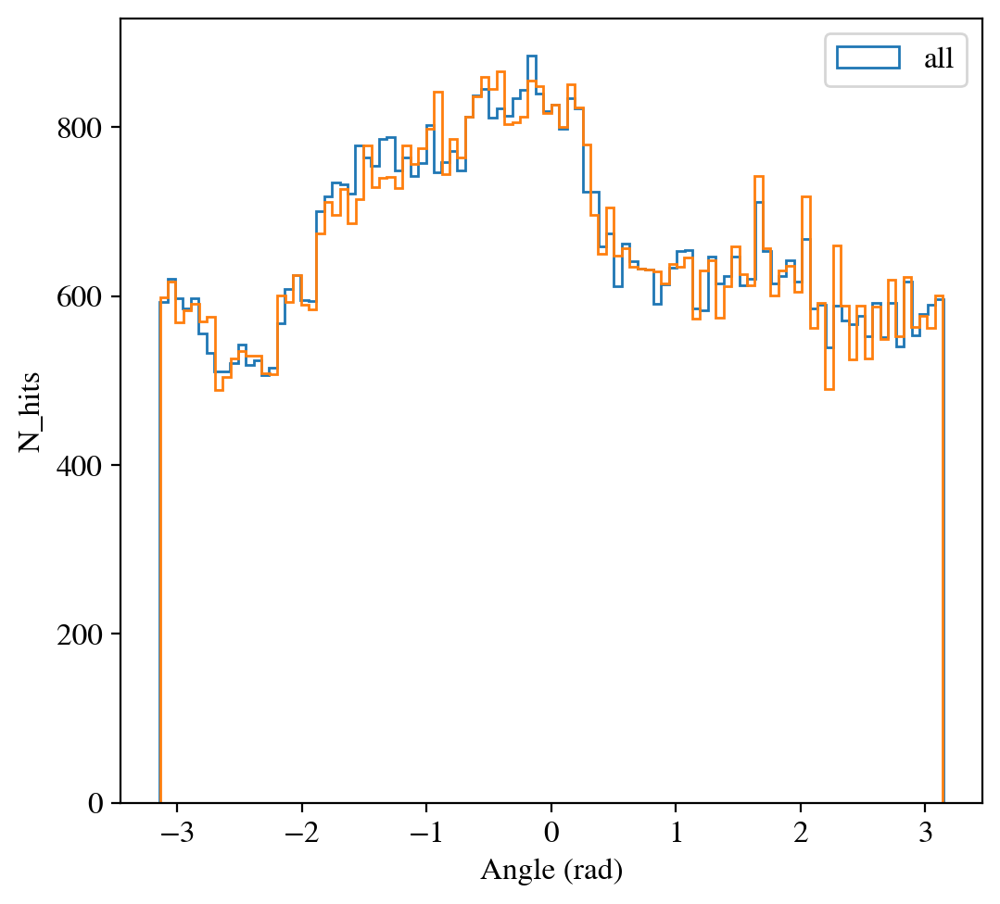

In [38]:
plt.hist(phi, 100, histtype='step', label='all')
# plt.hist(phi_neu, 100, histtype='step', label='neutrons')
# plt.hist(phi_pho, 100, histtype='step', label='photons')
plt.hist(phi_new, 100, histtype='step')
plt.xlabel('Angle (rad)')
plt.ylabel('N_hits')
plt.legend()
print("")

In [39]:
def octoSide(squareSide):
    return squareSide / (1 + np.sqrt(2))

def octoHeight(squareSide):
    l = octoSide(squareSide)
    d = l/np.sqrt(2)
    return np.sqrt( d**2 - (l/2)**2 )

In [ ]:
octoSide(1800), octoHeight(1800), octoSide(4240)

(745.5844122715712, 372.7922061357856, 1756.265504461923, 381.0764773832475)

In [83]:
octoSide(1840), octoHeight(1840), octoHeight(1840)+0.5*octoSide(1840)

(762.152954766495, 381.0764773832475, 762.152954766495)

In [41]:
dd = lambda h, l, L : (h**2 + ((L-l)/2)**2)**0.5

In [42]:
np.sqrt(2)*1100

1555.6349186104046

In [43]:
frontcrv1b = CRVHitMap("../Root_outputs/CRVAnalysis.root")

In [44]:
nbins = int(1e4)
nsamples = int(1e6)
# nsamples = int(nHitsPerBunch*nBunches)

xmod = frontcrv1b.HitY[frontcrv1b.HitT<=2e6]
ymod = frontcrv1b.HitZ[frontcrv1b.HitT<=2e6]

hist2d, xbins, ybins = getPDFfromDist_2D(xmod, ymod, nbins)
x_dist, y_dist = generateFromDist_2D(xmod, ymod, nbins, nsamples)

pdf norm = 6.18e+00


In [45]:
# moduleL = 3000
# modulel = 1240
moduleL = 2740
modulel = 4240-moduleL
moduleL, modulel

(2740, 1500)

In [46]:
nstrips = 48*2 ## n_strips/module
side_length = moduleL+modulel
side_length//2, nstrips

(2120, 96)

In [47]:
## scaled nHits for redistribution 
nHits_b = int(1e6)
nPOT_b = nHits_b / nHitsPerPOT

nHits/1e6, len(x_dist)/1e6, nPOT/1e6, nPOT_b/1e6

(0.163669, 1.0, 99.995, 610.95870323641)

pdf norm = 1.15e+05



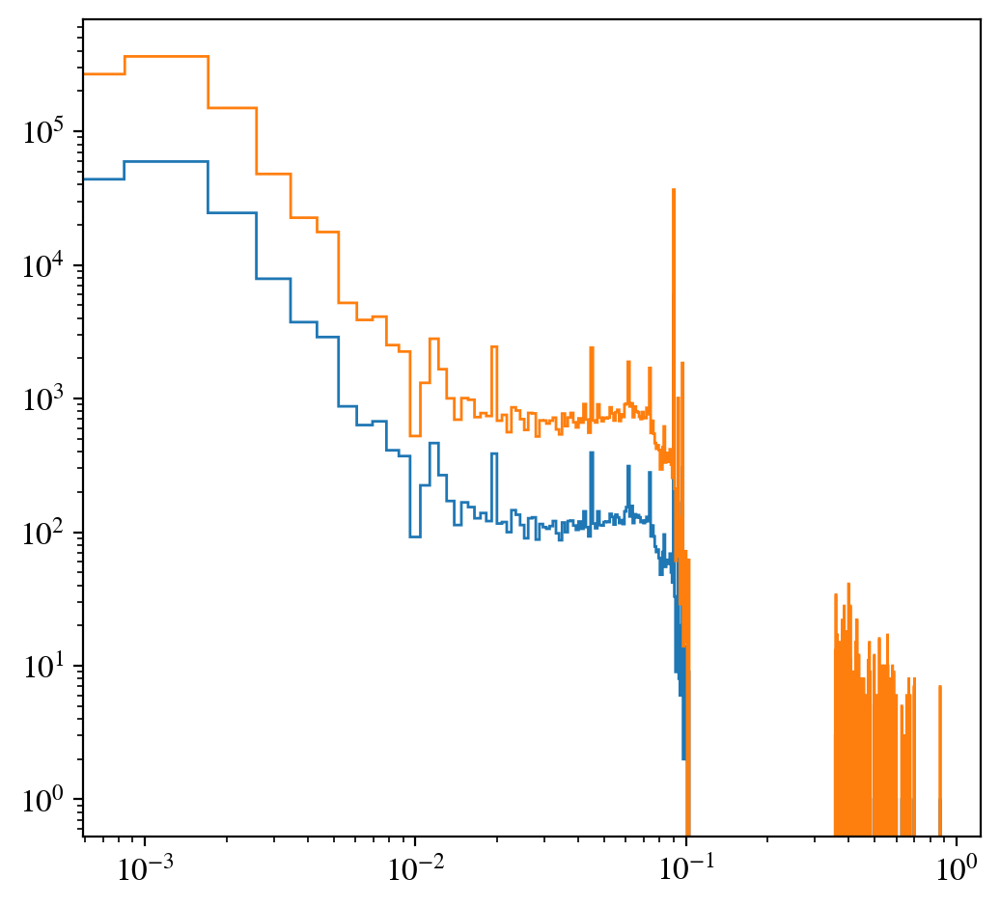

In [48]:
weights_dist = generateFromDist(frontcrv1b.RPCweights, int(1e5), int(1e6))

plt.hist(frontcrv1b.RPCweights, bins=1000, histtype='step')
plt.hist(weights_dist, bins=1000, histtype='step')
plt.xscale('log')
plt.yscale('log')
print("")

In [49]:
### use generated YZ hits and generated weights instead, and scale number of POTs.
frontcrv1b.HitY = x_dist
frontcrv1b.HitZ = y_dist
frontcrv1b.RPCweights = weights_dist
frontcrv1b.nPOT = nPOT_b
frontcrv1b.nhits = nHits_b

In [50]:
frontcrv1b.getGeometry(nstrips=96, xmin=-2120, xmax=2120, ymin=-2120, ymax=2120, L=moduleL, l=modulel, geo_type='rectangular strips 1')
frontcrv1b.getHitsPerChannel()

Rectangular module dimensions: L = 2740, l = 1500, D = 4240


In [51]:
frontcrv1b.hitRateFactor

4091.9295964798243

In [52]:
HitRateArr = []
for i in range(frontcrv1b.geometry.nstrips):
    HitRateArr.append(frontcrv1b.module1Hits[i])
    HitRateArr.append(frontcrv1b.module2Hits[i])
    HitRateArr.append(frontcrv1b.module3Hits[i])
    HitRateArr.append(frontcrv1b.module4Hits[i])
AvgHitRatePerStrip1b = np.mean(HitRateArr)
AvgHitRatePerStrip1b/1000

92.98717346672092

AvgHitRatePerStrip = 92.99 kHz
max_hit_rate = 198.12 kHz/strip


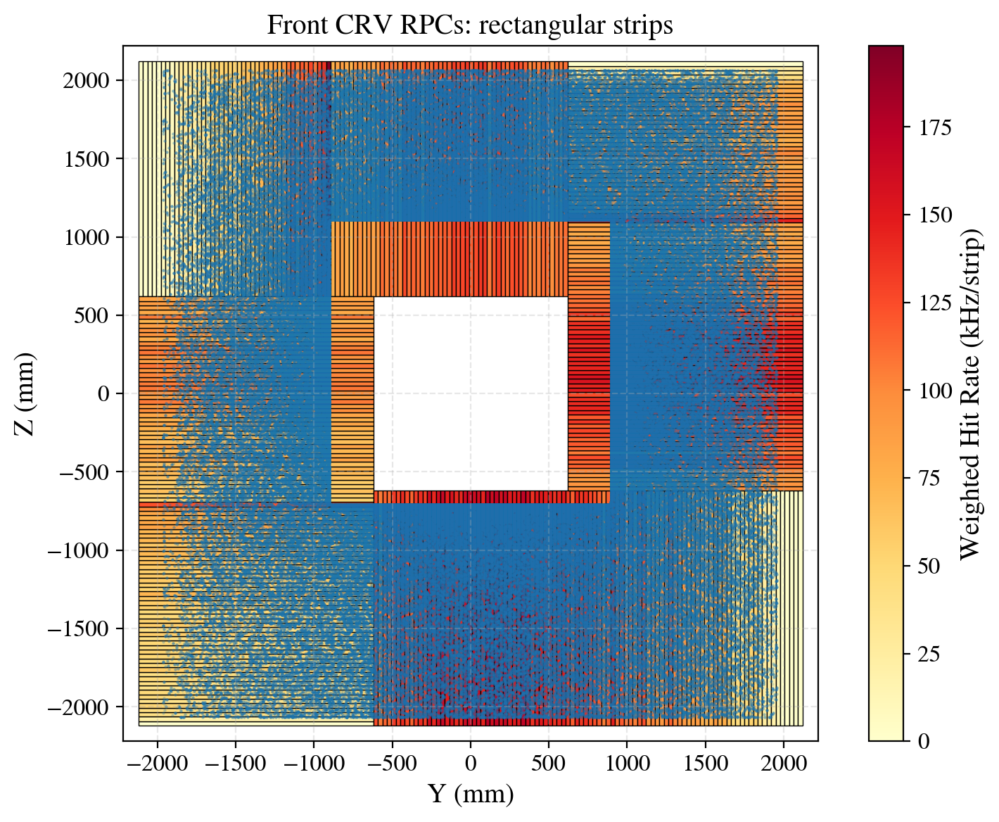

In [53]:
print("AvgHitRatePerStrip = {:.2f} kHz".format(AvgHitRatePerStrip1b/1000))
plot_strip_hitmap(frontcrv1b, plotHits=True)

In [54]:
frontcrv1 = CRVHitMap("../Root_outputs/CRVAnalysis.root")

In [55]:
frontcrv1.getGeometry(nstrips=96, xmin=-2120, xmax=2120, ymin=-2120, ymax=2120, L=moduleL, l=modulel, geo_type='rectangular strips 1')
frontcrv1.getHitsPerChannel()

Rectangular module dimensions: L = 2740, l = 1500, D = 4240


In [56]:
HitRateArr = []
for i in range(frontcrv1.geometry.nstrips):
    HitRateArr.append(frontcrv1.module1Hits[i])
    HitRateArr.append(frontcrv1.module2Hits[i])
    HitRateArr.append(frontcrv1.module3Hits[i])
    HitRateArr.append(frontcrv1.module4Hits[i])
AvgHitRatePerStrip1 = np.mean(HitRateArr)
AvgHitRatePerStrip1/1000

93.14396670898999

In [57]:
frontcrv1.geometry.L, frontcrv1.hitRateFactor

(2740, 25001.250062503124)

AvgHitRatePerStrip = 93.14 kHz
max_hit_rate = 205.71 kHz/strip


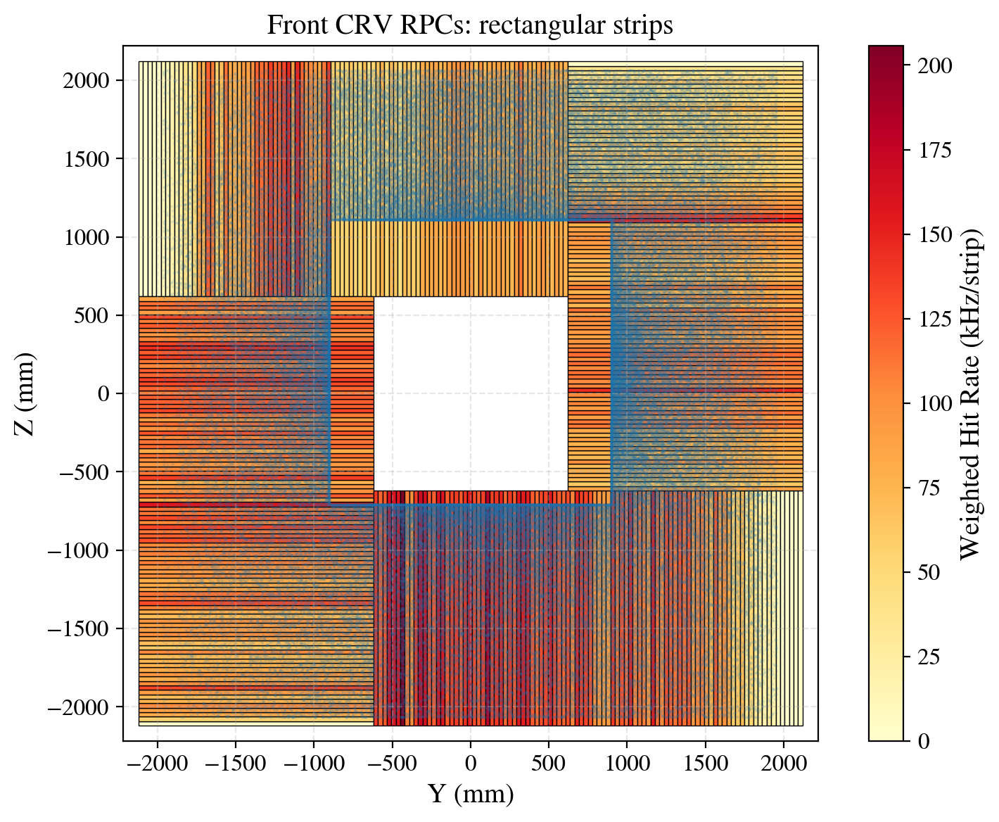

In [58]:
print("AvgHitRatePerStrip = {:.2f} kHz".format(AvgHitRatePerStrip1/1000))
plot_strip_hitmap(frontcrv1, plotHits=True)

In [59]:
frontcrv2 = CRVHitMap("../Root_outputs/CRVAnalysis.root")

In [60]:
frontcrv2.getGeometry(nstrips=96, xmin=-2120, xmax=2120, ymin=-2120, ymax=2120, L=moduleL, l=modulel, geo_type='rectangular strips 2')
frontcrv2.getHitsPerChannel()

Rectangular module dimensions: L = 2740, l = 1500, D = 4240


In [61]:
HitRateArr = []
for i in range(frontcrv2.geometry.nstrips):
    HitRateArr.append(frontcrv2.module1Hits[i])
    HitRateArr.append(frontcrv2.module2Hits[i])
    HitRateArr.append(frontcrv2.module3Hits[i])
    HitRateArr.append(frontcrv2.module4Hits[i])
AvgHitRatePerStrip2 = np.mean(HitRateArr)
AvgHitRatePerStrip2/1000

93.14396670899

AvgHitRatePerStrip = 93.14 kHz
max_hit_rate = 425.99 kHz/strip


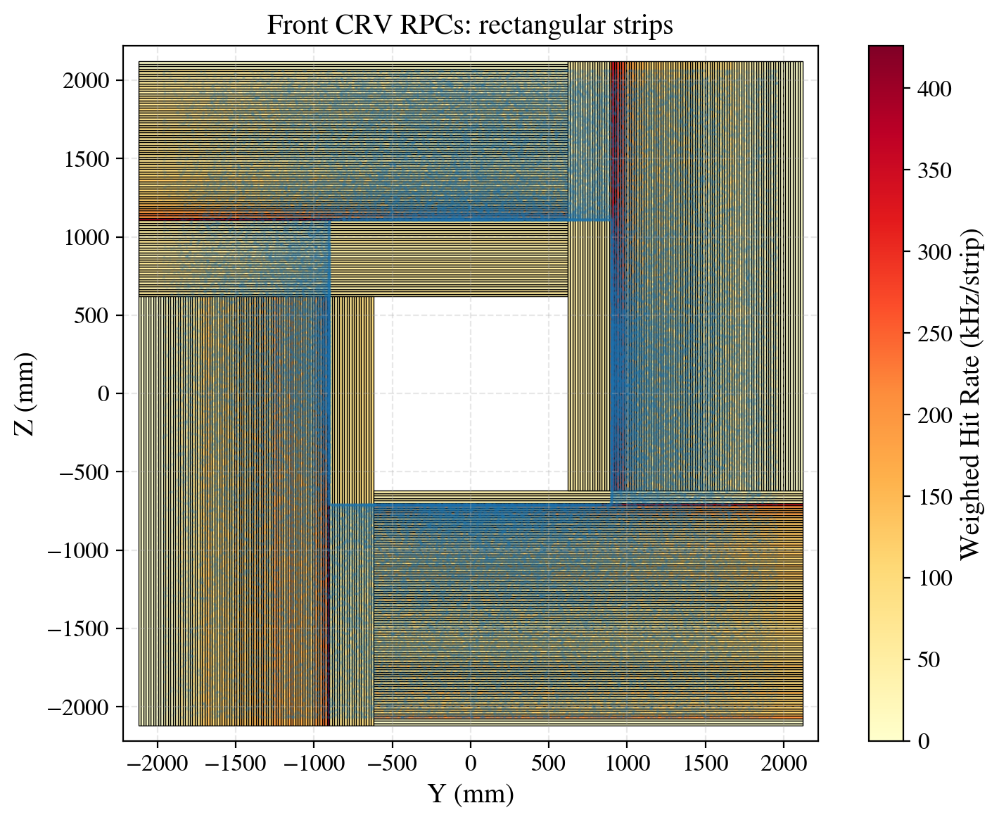

In [62]:
print("AvgHitRatePerStrip = {:.2f} kHz".format(AvgHitRatePerStrip2/1000))
plot_strip_hitmap(frontcrv2, plotHits=True)

In [63]:
hole_side = side_length - 2*modulel ## side length of hole
moduleH = (side_length - hole_side)//2 ## trapezoid height in trapezoidal geo

hole_side, moduleH

(1240, 1500)

In [64]:
moduleL+modulel, moduleL-modulel

(4240, 1240)

In [122]:
740 * (1+np.sqrt(2))/2

893.2590180780451

In [402]:
def trapezeL(l, H, alpha):
    return l + 2*H*np.tan(alpha)

def trapezeL_2(l, H, d):
    return 2*np.sqrt(d**2 - H**2) + l

def octoR(l):
    return l*(1+np.sqrt(2))/2

def octol(R):
    return R/(1+np.sqrt(2))

def trapezeAlpha(l, L, H):
    y = (L-l)/2
    x = H
    return np.arctan2(y, x)

def trapezeH(l, L, alpha):
    return (L-l) / (2*np.tan(alpha))

In [ ]:
trapezeL(762, 1000, np.pi/8), trapezeAlpha

1590.4271247461902

In [369]:
trapezeH(762, 1590, np.pi/8)

999.4844148224613

In [286]:
trapezeAlpha(730, 1800, 1000)/np.pi,  trapezeAlpha(730, 1600, 1100)/np.pi, 1/8

(0.15637100674512244, 0.1198696941343854, 0.125)

In [406]:
np.arctan(-1)/np.pi

-0.25

In [469]:
def getT2T3fromT1(R, L1, h1, gamma, h3):
    l = 2*R/(1+np.sqrt(2))
    d1 = np.sqrt(((L1-l)/2)**2 + h1**2)
    alpha1 = np.arctan((L1-l)/(2*h1)) + np.pi/2
    alpha2 = np.pi + gamma - alpha1
    e2 = d1*np.sin(alpha2 - np.pi/2)
    h2 = d1*np.cos(alpha2 - np.pi/2)
    L2 = (R + h3 - L1/2)/np.cos(gamma)
    f2 = L2 - e2
    beta2 = np.arctan(f2/h2) + np.pi/2
    d2 = h3/np.cos(beta2 - np.pi/2)
    L3 = 2*np.sqrt(d2**2 - h3**2) + l
    return l, d1, h2, d2, L2, L3

In [470]:
getT2T3fromT1(900, 2000, 1000, np.pi/4, 1300)

(745.5844122715712,
 1180.4192546227018,
 1150.6096654409878,
 2076.7747733764727,
 1697.056274847714,
 3984.7160609285993)

In [415]:
np.arctan(1000/2000)/np.pi, 1/8

(0.1475836176504333, 0.125)

In [292]:
np.tan(np.pi/4), np.tan(-np.pi/4)

(0.9999999999999999, -0.9999999999999999)

745.5844122715712 1180.4192546227018 1150.6096654409878 2076.7747733764727 1697.056274847714 3984.7160609285993
Isosceles trapezoid slant side length: 1195.738924415479
Computed left side length: 1370.5345024589503
Isosceles trapezoid slant side length: 2098.9797373719975


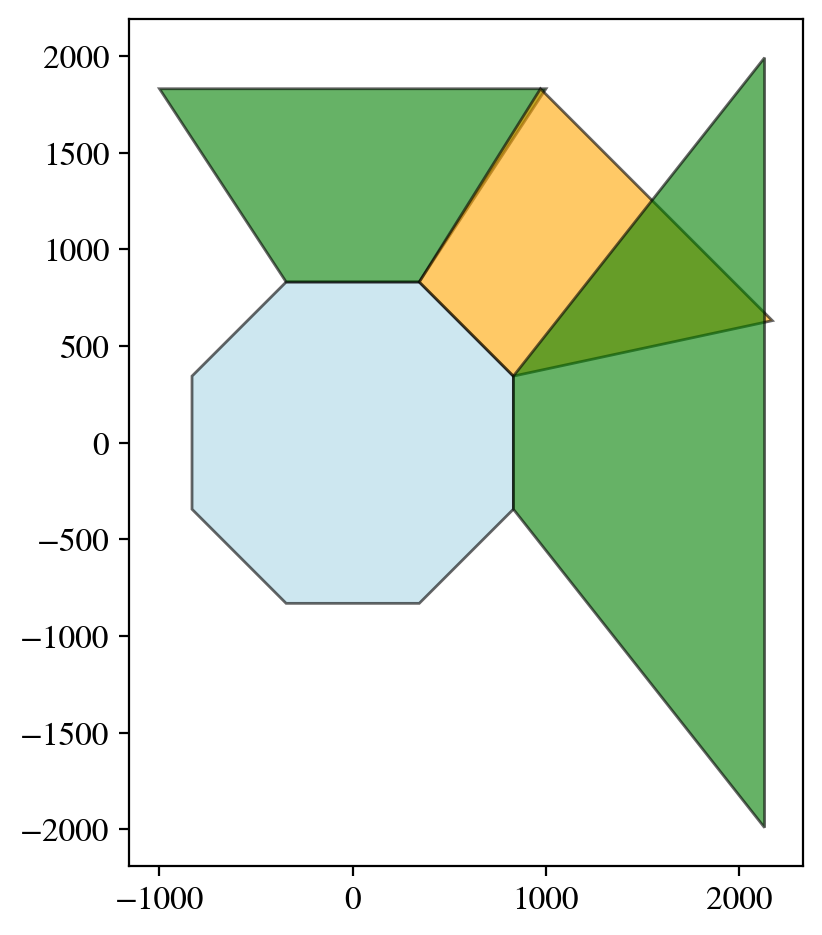

In [471]:
import matplotlib.pyplot as plt
import numpy as np

def regular_polygon(n_sides, radius=1.0, center=(0,0), rotation=0):
    cx, cy = center
    angles = np.linspace(0, 2*np.pi, n_sides, endpoint=False) + rotation
    return [(cx + radius*np.cos(a), cy + radius*np.sin(a)) for a in angles]

def add_trapezoid(ax, base_p1, base_p2, height, opposite_side, right_side, polygon_center, color="orange"):
    p1 = np.array(base_p1)
    p2 = np.array(base_p2)

    # Base vector and perpendicular
    edge_vec = p2 - p1
    edge_len = np.linalg.norm(edge_vec)
    edge_dir = edge_vec / edge_len
    perp = np.array([-edge_dir[1], edge_dir[0]])  # perpendicular

    # Ensure perpendicular points outward
    midpoint = (p1 + p2) / 2
    to_center = polygon_center - midpoint
    if np.dot(perp, to_center) > 0:
        perp = -perp

    # Place outer_p2 (right corner of opposite side)
    outer_p2_guess = p2 + perp * height
    along_shift = np.sqrt(max(right_side**2 - height**2, 0))
    outer_p2 = outer_p2_guess + edge_dir * along_shift

    # Now place outer_p1 so that outer edge length = opposite_side
    outer_p1 = outer_p2 - edge_dir * opposite_side

    # Compute left side length for info
    left_side_len = np.linalg.norm(outer_p1 - p1)

    # Draw trapezoid
    xs = [p1[0], p2[0], outer_p2[0], outer_p1[0]]
    ys = [p1[1], p2[1], outer_p2[1], outer_p1[1]]
    ax.fill(xs, ys, color=color, alpha=0.6, edgecolor="black")

    return left_side_len

def add_isosceles_trapezoid(ax, base_p1, base_p2, height, opposite_side, polygon_center, color="green"):
    p1 = np.array(base_p1)
    p2 = np.array(base_p2)

    # Base vector and perpendicular
    edge_vec = p2 - p1
    edge_len = np.linalg.norm(edge_vec)
    edge_dir = edge_vec / edge_len
    perp = np.array([-edge_dir[1], edge_dir[0]])  # perpendicular

    # Ensure perpendicular points outward
    midpoint = (p1 + p2) / 2
    to_center = polygon_center - midpoint
    if np.dot(perp, to_center) > 0:
        perp = -perp

    # Horizontal offset for symmetry
    offset = (edge_len - opposite_side) / 2
    outer_p1 = p1 + perp * height + edge_dir * offset
    outer_p2 = p2 + perp * height - edge_dir * offset

    # Draw trapezoid
    xs = [p1[0], p2[0], outer_p2[0], outer_p1[0]]
    ys = [p1[1], p2[1], outer_p2[1], outer_p1[1]]
    ax.fill(xs, ys, color=color, alpha=0.6, edgecolor="black")

    # Equal slant length
    side_len = np.linalg.norm(outer_p1 - p1)

    return side_len

R, L1, h1, gamma, h3 = 900, 2000, 1000, np.pi/4, 1300
l, d1, h2, d2, L2, L3 = getT2T3fromT1(R, L1, h1, gamma, h3)
print(l, d1, h2, d2, L2, L3)

# --- Example ---
fig, ax = plt.subplots()

# Rotated octagon
octagon = regular_polygon(8, radius=R, rotation=3*np.pi/8)
oct_x, oct_y = zip(*octagon)
ax.fill(oct_x, oct_y, color="lightblue", alpha=0.6, edgecolor="black")

# Polygon center
center = np.mean(octagon, axis=0)

# Add isosceles trapezoid to side
base_p1, base_p2 = octagon[0], octagon[1]
side_len = add_isosceles_trapezoid(ax, base_p1, base_p2,
                                   height=h1, opposite_side=L1,
                                   polygon_center=center, color="green")
print("Isosceles trapezoid slant side length:", side_len)

# Add asymmetric trapezoid to side
base_p1, base_p2 = octagon[-1], octagon[0]
left_len = add_trapezoid(ax, base_p1, base_p2,
                         height=h2, opposite_side=L2, right_side=d1,
                         polygon_center=center, color="orange")
print("Computed left side length:", left_len)

# Add isosceles trapezoid to side
base_p1, base_p2 = octagon[-2], octagon[-1]
side_len = add_isosceles_trapezoid(ax, base_p1, base_p2,
                                   height=h3, opposite_side=L3,
                                   polygon_center=center, color="green")
print("Isosceles trapezoid slant side length:", side_len)


ax.set_aspect("equal")
plt.show()


In [ ]:
### TENTATIVE
class ModuleGeoOctoTrapezoidal0:
    def __init__(self, nstrips, xcenter, ycenter, Da, Db, l, L1, H1, gamma):
        self.nstrips = nstrips ## number of strips per module
        self.xcenter = xcenter ## center of inner octogon
        self.ycenter = ycenter ## center of inner octogon
        self.Da = Da ## total horizontal length
        self.Db = Db ## total vertical length
        self.l = l ## trapeze short base
        self.R = octoR(l)
        self.getParameters0()
        # self.getParameters(l, L1, H1, gamma)
        print("Module short base = {}".format(self.l))
        print("Module long bases = {}".format(self.Ls))
        print("Module heights = {}".format(self.Hs))
        print("Module angles = {} pi".format(self.alphas/np.pi))
        self.outPitches = self.Ls/self.nstrips ## outer pitches of trapezoid modules
        self.inPitch = self.l/self.nstrips ## inner pitches of trapezoid modules
        print("Module long pitches = {}".format(self.outPitches))
        print("Module short pitch = {}".format(self.inPitch))
        self.makeStrips()

    def getParameters0(self):
        # self.Ls = 1560*np.ones(8) ## trapeze long bases
        self.Hs = 1400*np.ones(8) ## trapeze heights
        self.Ls = trapezeL(self.l, self.Hs, np.pi/8)
        # self.Hs = np.array([1100, 1100, 1100])
        self.alphas = trapezeAlpha(self.l, self.Ls, self.Hs) ## trapeze angle between short base and side

    def getParameters(self, l, L1, H1, gamma):
        Ls = np.zeros(8)
        Hs = np.zeros(8)
        alphas = np.zeros(8)

        ### module 1
        Ls[0] = L1
        Hs[0] = H1
        alphas[0] = trapezeAlpha(l, L1, H1)

        ### module 2
        Ls[1] = (self.Da - L1) / (2*np.cos(gamma))
        alphas[1] = np.pi/2 - gamma - alphas[0]
        Hs[1] = (Ls[1] - l) / (2*np.tan(alphas[1]))

        # ### module 2
        # Ls[1] = (self.Da - L1) / (2*np.cos(gamma))
        # alphas[1] = np.pi/2 - gamma - alphas[0]
        # Hs[1] = (Ls[1] - l) / (2*np.tan(alphas[1]))

        # ### module 8
        # Ls[2] = Ls[1]
        # alphas[2] = alphas[2]
        # Hs[2] = Hs[1]

        self.Ls = Ls
        self.Hs = Hs
        self.alphas = alphas
        
    def makeStrips(self):
        nstrips = self.nstrips
        xc, yc = self.xcenter, self.ycenter
        Hs = self.Hs
        Ls = self.Ls
        l = self.l
        R = self.R
        dLs = self.outPitches
        dl = self.inPitch

        self.module1strips = {}  # Dict of polygons
        self.module2strips = {}  
        self.module3strips = {}  
        self.module4strips = {}  
        self.module5strips = {} 
        self.module6strips = {}  
        self.module7strips = {}  
        self.module8strips = {}  
        self.module9strips = {}  
        self.module10strips = {}  
        self.module11strips = {}  
        self.module12strips = {}  

        ### module 1
        dX = dLs[0]
        # dY = 0
        dx = dl
        # dy = 0
        for i in range(nstrips):
            x0 = xc - Ls[0]/2 + i*dX
            y0 = yc + R + Hs[0]
            x1 = xc - Ls[0]/2 + (i+1)*dX
            y1 = y0
            x2 = xc - l/2 + i*dx
            y2 = yc + R
            x3 = xc - l/2 + (i+1)*dx
            y3 = y2

            poly = Polygon([
                (x0, y0),  # top left
                (x1, y1),  # top right
                (x3, y3),  # bottom right
                (x2, y2)   # bottom left
            ])
            self.module1strips[i] = poly

        ### module 2
        alpha = -np.pi/4 ## module angle
        # alpha = -self.alphas[0] ## angle between module 1 and module 2
        dX = dLs[1]*np.cos(alpha)
        dY = dLs[1]*np.sin(alpha)
        dx = dl*np.cos(alpha)
        dy = dl*np.sin(alpha)
        for i in range(nstrips):
            x0 = xc + Ls[1]/2 + i*dX
            y0 = yc + R + Hs[1] + i*dY
            x1 = xc + Ls[1]/2 + (i+1)*dX
            y1 = yc + R + Hs[1] + (i+1)*dY
            x2 = xc + l/2 + i*dx
            y2 = yc + R + i*dy
            x3 = xc + l/2 + (i+1)*dx
            y3 = yc + R + (i+1)*dy

            poly = Polygon([
                (x0, y0),  # top left
                (x1, y1),  # top right
                (x3, y3),  # bottom right
                (x2, y2)   # bottom left
            ])
            self.module2strips[i+nstrips] = poly

        ### module 3
        # alpha = -np.pi/4 ## module angle
        # dX = dLs[1]*np.cos(alpha)
        dY = -dLs[2]
        # dx = dl*np.cos(alpha)
        dy = -dl
        for i in range(nstrips):
            x0 = xc + R + Hs[2]
            y0 = yc + Ls[2]/2 + i*dY
            x1 = x0
            y1 = yc + Ls[2]/2 + (i+1)*dY
            x2 = xc + R
            y2 = yc + l/2 + i*dy
            x3 = x2
            y3 = yc + l/2 + (i+1)*dy

            poly = Polygon([
                (x0, y0),  # top left
                (x1, y1),  # top right
                (x3, y3),  # bottom right
                (x2, y2)   # bottom left
            ])
            self.module3strips[i+2*nstrips] = poly

        ### module 4
        alpha = np.pi/4 ## module angle
        dX = dLs[1]*np.cos(alpha)
        dY = dLs[1]*np.sin(alpha)
        dx = dl*np.cos(alpha)
        dy = dl*np.sin(alpha)
        for i in range(nstrips):
            x0 = xc + Ls[1]/2 + i*dX
            y0 = yc - R - Hs[1] + i*dY
            x1 = xc + Ls[1]/2 + (i+1)*dX
            y1 = yc - R - Hs[1] + (i+1)*dY
            x2 = xc + l/2 + i*dx
            y2 = yc - R + i*dy
            x3 = xc + l/2 + (i+1)*dx
            y3 = yc - R + (i+1)*dy

            poly = Polygon([
                (x0, y0),  # top left
                (x1, y1),  # top right
                (x3, y3),  # bottom right
                (x2, y2)   # bottom left
            ])
            self.module4strips[i+3*nstrips] = poly
        
        ### module 5
        dX = dLs[0]
        # dY = 0
        dx = dl
        # dy = 0
        for i in range(nstrips):
            x0 = xc - Ls[0]/2 + i*dX
            y0 = yc - R - Hs[0]
            x1 = xc - Ls[0]/2 + (i+1)*dX
            y1 = y0
            x2 = xc - l/2 + i*dx
            y2 = yc - R
            x3 = xc - l/2 + (i+1)*dx
            y3 = y2

            poly = Polygon([
                (x0, y0),  # top left
                (x1, y1),  # top right
                (x3, y3),  # bottom right
                (x2, y2)   # bottom left
            ])
            self.module5strips[i+4*nstrips] = poly
        
        ### module 6
        alpha = 3*np.pi/4 ## module angle
        dX = dLs[1]*np.cos(alpha)
        dY = dLs[1]*np.sin(alpha)
        dx = dl*np.cos(alpha)
        dy = dl*np.sin(alpha)
        for i in range(nstrips):
            x0 = xc - Ls[1]/2 + i*dX
            y0 = yc - R - Hs[1] + i*dY
            x1 = xc - Ls[1]/2 + (i+1)*dX
            y1 = yc - R - Hs[1] + (i+1)*dY
            x2 = xc - l/2 + i*dx
            y2 = yc - R + i*dy
            x3 = xc - l/2 + (i+1)*dx
            y3 = yc - R + (i+1)*dy

            poly = Polygon([
                (x0, y0),  # top left
                (x1, y1),  # top right
                (x3, y3),  # bottom right
                (x2, y2)   # bottom left
            ])
            self.module6strips[i+5*nstrips] = poly

        ### module 7
        # alpha = -np.pi/4 ## module angle
        # dX = dLs[1]*np.cos(alpha)
        dY = -dLs[2]
        # dx = dl*np.cos(alpha)
        dy = -dl
        for i in range(nstrips):
            x0 = xc - R - Hs[2]
            y0 = yc + Ls[2]/2 + i*dY
            x1 = x0
            y1 = yc + Ls[2]/2 + (i+1)*dY
            x2 = xc - R
            y2 = yc + l/2 + i*dy
            x3 = x2
            y3 = yc + l/2 + (i+1)*dy

            poly = Polygon([
                (x0, y0),  # top left
                (x1, y1),  # top right
                (x3, y3),  # bottom right
                (x2, y2)   # bottom left
            ])
            self.module7strips[i+6*nstrips] = poly

        ### module 8
        alpha = -3*np.pi/4 ## module angle
        dX = dLs[1]*np.cos(alpha)
        dY = dLs[1]*np.sin(alpha)
        dx = dl*np.cos(alpha)
        dy = dl*np.sin(alpha)
        for i in range(nstrips):
            x0 = xc - Ls[1]/2 + i*dX
            y0 = yc + R + Hs[1] + i*dY
            x1 = xc - Ls[1]/2 + (i+1)*dX
            y1 = yc + R + Hs[1] + (i+1)*dY
            x2 = xc - l/2 + i*dx
            y2 = yc + R + i*dy
            x3 = xc - l/2 + (i+1)*dx
            y3 = yc + R + (i+1)*dy

            poly = Polygon([
                (x0, y0),  # top left
                (x1, y1),  # top right
                (x3, y3),  # bottom right
                (x2, y2)   # bottom left
            ])
            self.module8strips[i+7*nstrips] = poly

        ### module 9 (triangular)
        # alpha = np.pi/4 ## module angle
        Lx = R + Hs[1] - Ls[0]/2
        Ly = R + Hs[0] - Ls[1]/2
        dLx = Lx/self.nstrips
        dLy = Ly/self.nstrips
        for i in range(nstrips):
            x0 = xc - R - Hs[1] + i*dLx
            y0 = yc + Ls[1]/2 + i*dLy
            x1 = xc - R - Hs[1] + (i+1)*dLx
            y1 = yc + Ls[1]/2 + (i+1)*dLy
            x2 = x0
            y2 = yc + R + Hs[0]
            x3 = x1
            y3 = y2

            poly = Polygon([
                (x0, y0),  # top left
                (x1, y1),  # top right
                (x3, y3),  # bottom right
                (x2, y2)
            ])
            self.module9strips[i+8*nstrips] = poly

        octoDicts = [self.module1strips, self.module2strips, self.module3strips, self.module4strips,
                 self.module5strips, self.module6strips, self.module7strips, self.module8strips,
        ]
        trianDicts = [self.module9strips]
        allDicts = octoDicts.copy()
        allDicts.extend(trianDicts)
        
        self.allStrips = {}
        self.octoStrips = {}
        self.trianStrips = {}
        for d in allDicts:
            self.allStrips |= d
        for d in octoDicts:
            self.octoStrips |= d
        for d in trianDicts:
            self.trianStrips |= d



In [395]:
### TENTATIVE
class ModuleGeoOctoTrapezoidal:
    def __init__(self, nstrips, xcenter, ycenter, Da, Db, l, L1, H1, gamma):
        self.nstrips = nstrips ## number of strips per module
        self.xcenter = xcenter ## center of inner octogon
        self.ycenter = ycenter ## center of inner octogon
        self.Da = Da ## total horizontal length
        self.Db = Db ## total vertical length
        self.l = l ## trapeze short base
        self.R = octoR(l)
        self.getParameters0()
        # self.getParameters(l, L1, H1, gamma)
        print("Module short base = {}".format(self.l))
        print("Module long bases = {}".format(self.Ls))
        print("Module heights = {}".format(self.Hs))
        print("Module angles = {} pi".format(self.alphas/np.pi))
        self.outPitches = self.Ls/self.nstrips ## outer pitches of trapezoid modules
        self.inPitch = self.l/self.nstrips ## inner pitches of trapezoid modules
        print("Module long pitches = {}".format(self.outPitches))
        print("Module short pitch = {}".format(self.inPitch))
        self.makeStrips()

    def getParameters0(self):
        # self.Ls = 1560*np.ones(8) ## trapeze long bases
        self.Hs = 1400*np.ones(8) ## trapeze heights
        self.Ls = trapezeL(self.l, self.Hs, np.pi/8)
        # self.Hs = np.array([1100, 1100, 1100])
        self.alphas = trapezeAlpha(self.l, self.Ls, self.Hs) ## trapeze angle between short base and side

    def getParameters(self, l, L1, H1, gamma):
        Ls = np.zeros(8)
        Hs = np.zeros(8)
        alphas = np.zeros(8)

        ### module 1
        Ls[0] = L1
        Hs[0] = H1
        alphas[0] = trapezeAlpha(l, L1, H1)

        ### module 2
        Ls[1] = (self.Da - L1) / (2*np.cos(gamma))
        alphas[1] = np.pi/2 - gamma - alphas[0]
        Hs[1] = (Ls[1] - l) / (2*np.tan(alphas[1]))

        # ### module 2
        # Ls[1] = (self.Da - L1) / (2*np.cos(gamma))
        # alphas[1] = np.pi/2 - gamma - alphas[0]
        # Hs[1] = (Ls[1] - l) / (2*np.tan(alphas[1]))

        # ### module 8
        # Ls[2] = Ls[1]
        # alphas[2] = alphas[2]
        # Hs[2] = Hs[1]

        self.Ls = Ls
        self.Hs = Hs
        self.alphas = alphas
        
    def makeStrips(self):
        nstrips = self.nstrips
        xc, yc = self.xcenter, self.ycenter
        Hs = self.Hs
        Ls = self.Ls
        l = self.l
        R = self.R
        dLs = self.outPitches
        dl = self.inPitch

        self.module1strips = {}  # Dict of polygons
        self.module2strips = {}  
        self.module3strips = {}  
        self.module4strips = {}  
        self.module5strips = {} 
        self.module6strips = {}  
        self.module7strips = {}  
        self.module8strips = {}  
        self.module9strips = {}  
        self.module10strips = {}  
        self.module11strips = {}  
        self.module12strips = {}  

        ### module 1
        dX = dLs[0]
        # dY = 0
        dx = dl
        # dy = 0
        for i in range(nstrips):
            x0 = xc - Ls[0]/2 + i*dX
            y0 = yc + R + Hs[0]
            x1 = xc - Ls[0]/2 + (i+1)*dX
            y1 = y0
            x2 = xc - l/2 + i*dx
            y2 = yc + R
            x3 = xc - l/2 + (i+1)*dx
            y3 = y2

            poly = Polygon([
                (x0, y0),  # top left
                (x1, y1),  # top right
                (x3, y3),  # bottom right
                (x2, y2)   # bottom left
            ])
            self.module1strips[i] = poly

        ### module 2
        alpha = -np.pi/4 ## module angle
        # alpha = -self.alphas[0] ## angle between module 1 and module 2
        dX = dLs[1]*np.cos(alpha)
        dY = dLs[1]*np.sin(alpha)
        dx = dl*np.cos(alpha)
        dy = dl*np.sin(alpha)
        for i in range(nstrips):
            x0 = xc + Ls[1]/2 + i*dX
            y0 = yc + R + Hs[1] + i*dY
            x1 = xc + Ls[1]/2 + (i+1)*dX
            y1 = yc + R + Hs[1] + (i+1)*dY
            x2 = xc + l/2 + i*dx
            y2 = yc + R + i*dy
            x3 = xc + l/2 + (i+1)*dx
            y3 = yc + R + (i+1)*dy

            poly = Polygon([
                (x0, y0),  # top left
                (x1, y1),  # top right
                (x3, y3),  # bottom right
                (x2, y2)   # bottom left
            ])
            self.module2strips[i+nstrips] = poly

        ### module 3
        # alpha = -np.pi/4 ## module angle
        # dX = dLs[1]*np.cos(alpha)
        dY = -dLs[2]
        # dx = dl*np.cos(alpha)
        dy = -dl
        for i in range(nstrips):
            x0 = xc + R + Hs[2]
            y0 = yc + Ls[2]/2 + i*dY
            x1 = x0
            y1 = yc + Ls[2]/2 + (i+1)*dY
            x2 = xc + R
            y2 = yc + l/2 + i*dy
            x3 = x2
            y3 = yc + l/2 + (i+1)*dy

            poly = Polygon([
                (x0, y0),  # top left
                (x1, y1),  # top right
                (x3, y3),  # bottom right
                (x2, y2)   # bottom left
            ])
            self.module3strips[i+2*nstrips] = poly

        ### module 4
        alpha = np.pi/4 ## module angle
        dX = dLs[1]*np.cos(alpha)
        dY = dLs[1]*np.sin(alpha)
        dx = dl*np.cos(alpha)
        dy = dl*np.sin(alpha)
        for i in range(nstrips):
            x0 = xc + Ls[1]/2 + i*dX
            y0 = yc - R - Hs[1] + i*dY
            x1 = xc + Ls[1]/2 + (i+1)*dX
            y1 = yc - R - Hs[1] + (i+1)*dY
            x2 = xc + l/2 + i*dx
            y2 = yc - R + i*dy
            x3 = xc + l/2 + (i+1)*dx
            y3 = yc - R + (i+1)*dy

            poly = Polygon([
                (x0, y0),  # top left
                (x1, y1),  # top right
                (x3, y3),  # bottom right
                (x2, y2)   # bottom left
            ])
            self.module4strips[i+3*nstrips] = poly
        
        ### module 5
        dX = dLs[0]
        # dY = 0
        dx = dl
        # dy = 0
        for i in range(nstrips):
            x0 = xc - Ls[0]/2 + i*dX
            y0 = yc - R - Hs[0]
            x1 = xc - Ls[0]/2 + (i+1)*dX
            y1 = y0
            x2 = xc - l/2 + i*dx
            y2 = yc - R
            x3 = xc - l/2 + (i+1)*dx
            y3 = y2

            poly = Polygon([
                (x0, y0),  # top left
                (x1, y1),  # top right
                (x3, y3),  # bottom right
                (x2, y2)   # bottom left
            ])
            self.module5strips[i+4*nstrips] = poly
        
        ### module 6
        alpha = 3*np.pi/4 ## module angle
        dX = dLs[1]*np.cos(alpha)
        dY = dLs[1]*np.sin(alpha)
        dx = dl*np.cos(alpha)
        dy = dl*np.sin(alpha)
        for i in range(nstrips):
            x0 = xc - Ls[1]/2 + i*dX
            y0 = yc - R - Hs[1] + i*dY
            x1 = xc - Ls[1]/2 + (i+1)*dX
            y1 = yc - R - Hs[1] + (i+1)*dY
            x2 = xc - l/2 + i*dx
            y2 = yc - R + i*dy
            x3 = xc - l/2 + (i+1)*dx
            y3 = yc - R + (i+1)*dy

            poly = Polygon([
                (x0, y0),  # top left
                (x1, y1),  # top right
                (x3, y3),  # bottom right
                (x2, y2)   # bottom left
            ])
            self.module6strips[i+5*nstrips] = poly

        ### module 7
        # alpha = -np.pi/4 ## module angle
        # dX = dLs[1]*np.cos(alpha)
        dY = -dLs[2]
        # dx = dl*np.cos(alpha)
        dy = -dl
        for i in range(nstrips):
            x0 = xc - R - Hs[2]
            y0 = yc + Ls[2]/2 + i*dY
            x1 = x0
            y1 = yc + Ls[2]/2 + (i+1)*dY
            x2 = xc - R
            y2 = yc + l/2 + i*dy
            x3 = x2
            y3 = yc + l/2 + (i+1)*dy

            poly = Polygon([
                (x0, y0),  # top left
                (x1, y1),  # top right
                (x3, y3),  # bottom right
                (x2, y2)   # bottom left
            ])
            self.module7strips[i+6*nstrips] = poly

        ### module 8
        alpha = -3*np.pi/4 ## module angle
        dX = dLs[1]*np.cos(alpha)
        dY = dLs[1]*np.sin(alpha)
        dx = dl*np.cos(alpha)
        dy = dl*np.sin(alpha)
        for i in range(nstrips):
            x0 = xc - Ls[1]/2 + i*dX
            y0 = yc + R + Hs[1] + i*dY
            x1 = xc - Ls[1]/2 + (i+1)*dX
            y1 = yc + R + Hs[1] + (i+1)*dY
            x2 = xc - l/2 + i*dx
            y2 = yc + R + i*dy
            x3 = xc - l/2 + (i+1)*dx
            y3 = yc + R + (i+1)*dy

            poly = Polygon([
                (x0, y0),  # top left
                (x1, y1),  # top right
                (x3, y3),  # bottom right
                (x2, y2)   # bottom left
            ])
            self.module8strips[i+7*nstrips] = poly

        ### module 9 (triangular)
        # alpha = np.pi/4 ## module angle
        Lx = R + Hs[1] - Ls[0]/2
        Ly = R + Hs[0] - Ls[1]/2
        dLx = Lx/self.nstrips
        dLy = Ly/self.nstrips
        for i in range(nstrips):
            x0 = xc - R - Hs[1] + i*dLx
            y0 = yc + Ls[1]/2 + i*dLy
            x1 = xc - R - Hs[1] + (i+1)*dLx
            y1 = yc + Ls[1]/2 + (i+1)*dLy
            x2 = x0
            y2 = yc + R + Hs[0]
            x3 = x1
            y3 = y2

            poly = Polygon([
                (x0, y0),  # top left
                (x1, y1),  # top right
                (x3, y3),  # bottom right
                (x2, y2)
            ])
            self.module9strips[i+8*nstrips] = poly

        octoDicts = [self.module1strips, self.module2strips, self.module3strips, self.module4strips,
                 self.module5strips, self.module6strips, self.module7strips, self.module8strips,
        ]
        trianDicts = [self.module9strips]
        allDicts = octoDicts.copy()
        allDicts.extend(trianDicts)
        
        self.allStrips = {}
        self.octoStrips = {}
        self.trianStrips = {}
        for d in allDicts:
            self.allStrips |= d
        for d in octoDicts:
            self.octoStrips |= d
        for d in trianDicts:
            self.trianStrips |= d



In [396]:
qq = [1, 2]
q2 = qq.copy()
q2.extend([2, 4])
qq, q2

([1, 2], [1, 2, 2, 4])

In [ ]:
class ModuleGeoRect2b:

        def __init__(self, nstrips=10, xmin=-2120, xmax=2120, ymin=-2120, ymax=2120, Ls=[3000, 3000, 3000, 2800], ls=[1040, 1240, 1240, 1240]):
            self.nstrips = nstrips
            self.Xmax = xmax
            self.Xmin = xmin
            self.Ymax = ymax
            self.Ymin = ymin
            self.D = self.Xmax-self.Xmin
            self.Ls = np.array(Ls)
            self.ls = np.array(ls)
            # print("Rectangular module dimensions: L = {}, l = {}, D = {}".format(self.L, self.l, self.D))
            # self.pitch = self.l/self.nstrips   ## l for rect2, L for rect1
            self.makeStrips()

        def makeStrips(self):
            nstrips = self.nstrips
            dls = self.ls/nstrips
            halfLs = self.Ls/2
            yoff = (self.Ymax-self.Ymin) - self.Ls[1] - self.ls[0]
            self.yoff = yoff
            print("y_off = {}".format(yoff))
            ### module 1
            xStripsBounds1 = {} ## key: strip index, entry: strip bounds (xmin, xmax)
            yStripsBounds1 = {} ## key: strip index, entry: strip bounds (ymin, ymax)
            for i in range(nstrips):
                xStripsBounds1[i] = np.array([self.Xmin, self.Xmin + halfLs[0]])
                yStripsBounds1[i] = np.array([self.Ymax - self.ls[0] + i*dls[0], self.Ymax - self.ls[0] + (i+1)*dls[0]])
                xStripsBounds1[i+nstrips] = np.array([self.Xmin + halfLs[0], self.Xmin + 2*halfLs[0]])
                yStripsBounds1[i+nstrips] = yStripsBounds1[i]
            self.xStripsBounds1, self.yStripsBounds1 = xStripsBounds1, yStripsBounds1
            ### module 2
            xStripsBounds2 = {} ## key: strip index, entry: strip bounds (xmin, xmax)
            yStripsBounds2 = {} ## key: strip index, entry: strip bounds (ymin, ymax)
            for i in range(nstrips):
                xStripsBounds2[i] = np.array([self.Xmin + i*dls[1], self.Xmin + (i+1)*dls[1]])
                yStripsBounds2[i] = np.array([self.Ymin + yoff, self.Ymin + yoff + halfLs[1]])
                xStripsBounds2[i+nstrips] = xStripsBounds2[i]
                yStripsBounds2[i+nstrips] = np.array([self.Ymin + yoff + halfLs[1], self.Ymin + yoff + 2*halfLs[1]])
            self.xStripsBounds2, self.yStripsBounds2 = xStripsBounds2, yStripsBounds2
            ### module 3
            xStripsBounds3 = {} ## key: strip index, entry: strip bounds (xmin, xmax)
            yStripsBounds3 = {} ## key: strip index, entry: strip bounds (ymin, ymax)
            for i in range(nstrips):
                xStripsBounds3[i] = np.array([self.Xmax - 2*halfLs[2], self.Xmax - halfLs[2]])
                yStripsBounds3[i] = np.array([self.Ymin + yoff + i*dls[2], self.Ymin + yoff + (i+1)*dls[2]])
                xStripsBounds3[i+nstrips] = np.array([self.Xmax - halfLs[2], self.Xmax])
                yStripsBounds3[i+nstrips] = yStripsBounds3[i]
            self.xStripsBounds3, self.yStripsBounds3 = xStripsBounds3, yStripsBounds3
            ### module 4
            xStripsBounds4 = {} ## key: strip index, entry: strip bounds (xmin, xmax)
            yStripsBounds4 = {} ## key: strip index, entry: strip bounds (ymin, ymax)
            for i in range(nstrips):
                xStripsBounds4[i] = np.array([self.Xmax - self.ls[3] + i*dls[3], self.Xmax - self.ls[3] + (i+1)*dls[3]])
                yStripsBounds4[i] = np.array([self.Ymax - 2*halfLs[3] , self.Ymax - halfLs[3]])
                xStripsBounds4[i+nstrips] = xStripsBounds4[i]
                yStripsBounds4[i+nstrips] = np.array([self.Ymax - halfLs[3], self.Ymax])
            self.xStripsBounds4, self.yStripsBounds4 = xStripsBounds4, yStripsBounds4

            self.xAllStrips = self.xStripsBounds1 | self.xStripsBounds2 | self.xStripsBounds3 | self.xStripsBounds4
            self.yAllStrips = self.yStripsBounds1 | self.yStripsBounds2 | self.yStripsBounds3 | self.yStripsBounds4


class CRVHitMap:

    def __init__(self, inFilePath, nPOT=99995000, mode='front'):
        self.nPOT = nPOT
        self.outFileName = "{}.txt".format(Path(inFilePath).stem)
        self.file = uproot.open(inFilePath)
        self.fileKeys = self.file.keys()
        self.treeFront = self.file['treeFrontCRV']
        self.treeBack = self.file['treeBackCRV']
        self.treeFront_arr = self.treeFront.arrays()
        self.treeBack_arr = self.treeBack.arrays()
        self.getHitPos(mode)
        # self.getGeometry()
        
    def getHitPos(self, mode='front'):
        if mode=='front':
            treeFront_arr = self.treeFront_arr
            self.IsFirstHit = treeFront_arr.IsFirstHit
            self.RPCweights = treeFront_arr.RpcSensitivity[self.IsFirstHit==True]
            self.HitT = np.array(treeFront_arr.PositionT)[self.IsFirstHit==True]
            self.HitX = np.array(treeFront_arr.PositionX)[self.IsFirstHit==True]
            self.HitY = np.array(treeFront_arr.PositionY)[self.IsFirstHit==True]
            self.HitZ = np.array(treeFront_arr.PositionZ)[self.IsFirstHit==True]
            self.nhits = len(self.HitT)

    def getGeometry(self, nstrips=10, L=3000, l=1240, xmin=-2120, xmax=2120, ymin=-2120, ymax=2120, geo_type="rectangular strips 1"):
        self.geo_type = geo_type
        if geo_type=='grid':
            self.geometry = ModuleGeoGrid(ngrid=nstrips, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax)
        elif geo_type=='rectangular strips 1':
            self.geometry = ModuleGeoRect1(nstrips=nstrips, L=L, l=l, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax)
        elif geo_type=='rectangular strips 2':
            self.geometry = ModuleGeoRect2(nstrips=nstrips, L=L, l=l, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax)
        elif geo_type=='trapezoidal strips':
            self.geometry = ModuleGeoTrapezoidal(nstrips=nstrips, H=L, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax)
        elif geo_type=='rectangular strips 2b':
            self.geometry = ModuleGeoRect2b(nstrips=nstrips, Ls=L, ls=l, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax)
    
    # def getNewGeometry(self, nstrips=10, xcenter=0, ycenter=200, Ls=[1800, 1600, 1600], l=730, Hs=[1000, 1100, 1100, 1100]):
    #     self.geometry = ModuleGeoOctoTrapezoidal(nstrips, xcenter, ycenter, Ls, l, Hs)
    #     self.geo_type = "octogonal trapezoidal"
    # def getNewGeometry(self, nstrips=10, xcenter=0, ycenter=200, Da=4300, Db=4300, l=730, L1=1800, H1=1000, gamma=np.pi/4):
    #     self.geometry = ModuleGeoOctoTrapezoidal(nstrips, xcenter, ycenter, Da, Db, l, L1, H1, gamma)
    #     self.geo_type = "octogonal trapezoidal"
    def getNewGeometry(self, nstrips=10, center=[0,200], R=850, Ls=[1800, 1800, 1800], Hs=1000, gamma=np.pi/4):
        self.geometry = ModuleGeoOctoTrapezoidal(nstrips, xcenter, ycenter, Da, Db, l, L1, H1, gamma)
        self.geo_type = "octogonal trapezoidal"

    def getHitsPerChannel(self):
        self.POTperSec = 2.5e12 
        self.hitRateFactor = self.POTperSec / self.nPOT
        if self.geo_type=='rectangular strips 1' or self.geo_type=='rectangular strips 2':
            nstrips = self.geometry.nstrips
            self.module1Hits = {i : 0 for i in range(nstrips)}
            self.module2Hits = {i : 0 for i in range(nstrips)}
            self.module3Hits = {i : 0 for i in range(nstrips)}
            self.module4Hits = {i : 0 for i in range(nstrips)}
            for ihit in range(self.nhits):
                # iterate over hits
                xi = self.HitY[ihit]
                yi = self.HitZ[ihit]
                weight = self.RPCweights[ihit]
                # check if hit is in module
                if self.geometry.xBounds1[0]<=xi<self.geometry.xBounds1[1] and self.geometry.yBounds1[0]<=yi<self.geometry.yBounds1[1]:
                    for i in range(nstrips):
                        # check if hit is in strip
                        if self.geometry.xStripsBounds1[i][0]<=xi<self.geometry.xStripsBounds1[i][1] and self.geometry.yStripsBounds1[i][0]<=yi<self.geometry.yStripsBounds1[i][1]:
                            self.module1Hits[i] += 1*weight*self.hitRateFactor
                            break
                # check if hit is in module
                elif self.geometry.xBounds2[0]<=xi<self.geometry.xBounds2[1] and self.geometry.yBounds2[0]<=yi<self.geometry.yBounds2[1]:
                    for i in range(nstrips):
                        # check if hit is in strip
                        if self.geometry.xStripsBounds2[i][0]<=xi<self.geometry.xStripsBounds2[i][1] and self.geometry.yStripsBounds2[i][0]<=yi<self.geometry.yStripsBounds2[i][1]:
                            self.module2Hits[i] += 1*weight*self.hitRateFactor
                            break
                # check if hit is in module
                elif self.geometry.xBounds3[0]<=xi<self.geometry.xBounds3[1] and self.geometry.yBounds3[0]<=yi<self.geometry.yBounds3[1]:
                    for i in range(nstrips):
                        # check if hit is in strip
                        if self.geometry.xStripsBounds3[i][0]<=xi<self.geometry.xStripsBounds3[i][1] and self.geometry.yStripsBounds3[i][0]<=yi<self.geometry.yStripsBounds3[i][1]:
                            self.module3Hits[i] += 1*weight*self.hitRateFactor
                            break
                # check if hit is in module
                elif self.geometry.xBounds4[0]<=xi<self.geometry.xBounds4[1] and self.geometry.yBounds4[0]<=yi<self.geometry.yBounds4[1]:
                    for i in range(nstrips):
                        # check if hit is in strip
                        if self.geometry.xStripsBounds4[i][0]<=xi<self.geometry.xStripsBounds4[i][1] and self.geometry.yStripsBounds4[i][0]<=yi<self.geometry.yStripsBounds4[i][1]:
                            self.module4Hits[i] += 1*weight*self.hitRateFactor
                            break

        elif self.geo_type=='trapezoidal strips':
            self.stripHits = {i: 0 for i in self.geometry.allStrips}
            for ihit in range(self.nhits):
                xi = self.HitY[ihit]  # Assuming same convention
                yi = self.HitZ[ihit]
                point = Point(xi, yi)
                weight = self.RPCweights[ihit]
                for i, polygon in self.geometry.allStrips.items():
                    if polygon.contains(point):
                        self.stripHits[i] += 1 * weight * self.hitRateFactor
                        break

        elif self.geo_type=='octogonal trapezoidal':
            self.stripHits = {i: 0 for i in self.geometry.allStrips}
            for ihit in range(self.nhits):
                xi = self.HitY[ihit]  # Assuming same convention
                yi = self.HitZ[ihit]
                point = Point(xi, yi)
                weight = self.RPCweights[ihit]
                for i, polygon in self.geometry.allStrips.items():
                    if polygon.contains(point):
                        self.stripHits[i] += 1 * weight * self.hitRateFactor
                        break

        elif self.geo_type=='grid':
            ngrid2 = self.geometry.ngrid**2
            gridHits = {i : 0 for i in range(ngrid2)}
            xBounds = self.geometry.xBounds
            yBounds = self.geometry.yBounds
            for ihit in range(self.nhits):
                # iterate over hits
                xi = self.HitY[ihit]
                yi = self.HitZ[ihit]
                weight = self.RPCweights[ihit]
                # check if hit is in grid
                for i in range(ngrid2):
                    if xBounds[i][0]<=xi<xBounds[i][1] and yBounds[i][0]<=yi<yBounds[i][1]:
                        gridHits[i] += 1*weight*self.hitRateFactor
                        break
            self.gridHits = gridHits
        
        elif self.geo_type=='rectangular strips 2b':
            geo = self.geometry
            yoff = geo.yoff
            nstrips = 2*geo.nstrips ## n strips per module includes 2 PCBs
            self.module1Hits = {i : 0 for i in range(nstrips)}
            self.module2Hits = {i : 0 for i in range(nstrips)}
            self.module3Hits = {i : 0 for i in range(nstrips)}
            self.module4Hits = {i : 0 for i in range(nstrips)}
            for ihit in range(self.nhits):
                # iterate over hits
                xi = self.HitY[ihit]
                yi = self.HitZ[ihit]
                weight = self.RPCweights[ihit]
                # check if hit is in module 1
                if geo.Xmin<=xi<(geo.Xmin+geo.Ls[0]) and (geo.Ymax-geo.ls[0])<=yi<geo.Ymax:
                    for i in range(nstrips):
                        # check if hit is in strip
                        if self.geometry.xStripsBounds1[i][0]<=xi<self.geometry.xStripsBounds1[i][1] and self.geometry.yStripsBounds1[i][0]<=yi<self.geometry.yStripsBounds1[i][1]:
                            self.module1Hits[i] += 1*weight*self.hitRateFactor
                            break
                # check if hit is in module 2
                elif geo.Xmin<=xi<(geo.Xmin+geo.ls[1]) and (geo.Ymin+yoff)<=yi<(geo.Ymin+geo.Ls[1]+yoff):
                    for i in range(nstrips):
                        # check if hit is in strip
                        if self.geometry.xStripsBounds2[i][0]<=xi<self.geometry.xStripsBounds2[i][1] and self.geometry.yStripsBounds2[i][0]<=yi<self.geometry.yStripsBounds2[i][1]:
                            self.module2Hits[i] += 1*weight*self.hitRateFactor
                            break
                # check if hit is in module 3
                elif (geo.Xmax-geo.Ls[2])<=xi<geo.Xmax and (geo.Ymin+yoff)<=yi<(geo.Ymin+geo.ls[2]+yoff):
                    for i in range(nstrips):
                        # check if hit is in strip
                        if self.geometry.xStripsBounds3[i][0]<=xi<self.geometry.xStripsBounds3[i][1] and self.geometry.yStripsBounds3[i][0]<=yi<self.geometry.yStripsBounds3[i][1]:
                            self.module3Hits[i] += 1*weight*self.hitRateFactor
                            break
                # check if hit is in module 4
                elif (geo.Xmax-geo.ls[3])<=xi<geo.Xmax and (geo.Ymax-geo.Ls[3])<=yi<geo.Ymax:
                    for i in range(nstrips):
                        # check if hit is in strip
                        if self.geometry.xStripsBounds4[i][0]<=xi<self.geometry.xStripsBounds4[i][1] and self.geometry.yStripsBounds4[i][0]<=yi<self.geometry.yStripsBounds4[i][1]:
                            self.module4Hits[i] += 1*weight*self.hitRateFactor
                            break



In [181]:
frontcrv2b = CRVHitMap("../Root_outputs/CRVAnalysis.root")

In [182]:
Ls=[3000, 3000, 3000, 2800]
ls=[1040, 1240, 1240, 1240]

frontcrv2b.getGeometry(nstrips=48, xmin=-2120, xmax=2120, ymin=-2120, ymax=2120, L=Ls, l=ls, geo_type='rectangular strips 2b')
frontcrv2b.getHitsPerChannel()

y_off = 200


In [183]:
HitRateArr = []
for i in range(frontcrv2b.geometry.nstrips):
    HitRateArr.append(frontcrv2b.module1Hits[i])
    HitRateArr.append(frontcrv2b.module2Hits[i])
    HitRateArr.append(frontcrv2b.module3Hits[i])
    HitRateArr.append(frontcrv2b.module4Hits[i])
AvgHitRatePerStrip2b = np.mean(HitRateArr)
AvgHitRatePerStrip2b/1000

92.32935981180259

AvgHitRatePerStrip = 92.33 kHz
max_hit_rate = 530.00 kHz/strip


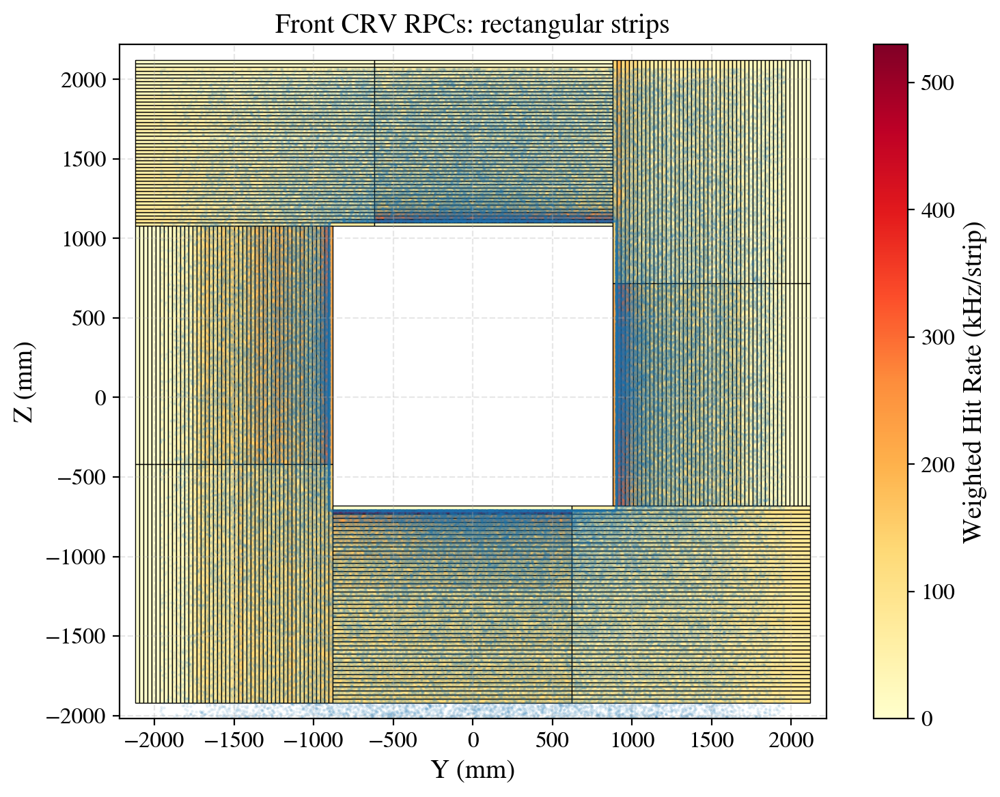

In [184]:
print("AvgHitRatePerStrip = {:.2f} kHz".format(AvgHitRatePerStrip2b/1000))
plot_strip_hitmap(frontcrv2b, plotHits=True)

In [185]:
frontcrv3 = CRVHitMap("../Root_outputs/CRVAnalysis.root")

In [186]:
frontcrv3.getGeometry(nstrips=24, xmin=-2120, xmax=2120, ymin=-2120, ymax=2120, L=1500, geo_type='trapezoidal strips')
frontcrv3.getHitsPerChannel()

Trapezoidal module dimensions: L = 4240, l = 1240, H = 1500


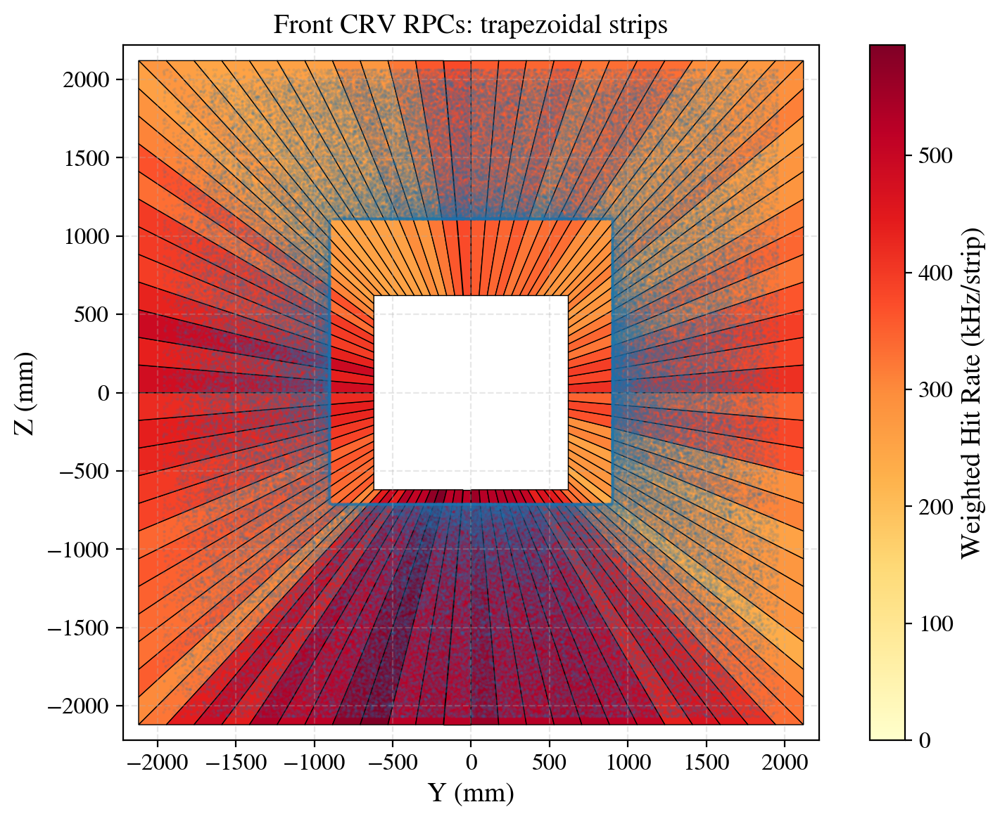

In [187]:
plot_trapezoidal_strip_hitmap(frontcrv3, plotHits=True)

In [188]:
np.stack([[1,2,3], [4,5,6]], axis=1)

array([[1, 4],
       [2, 5],
       [3, 6]])

In [189]:
stripPitch = 0.1*frontcrv1.geometry.pitch ## in cm
stripSurface = stripPitch * 0.1*frontcrv1.geometry.l ## in cm2
# stripSurface = stripPitch * 0.1*frontcrv1.geometry.L ## in cm2

stripPitch, stripSurface

(2.854166666666667, 428.12500000000006)

In [190]:
module1Hits_arr = np.array([ d for i,d in frontcrv1.module1Hits.items()])

np.mean(module1Hits_arr), np.mean(module1Hits_arr)/stripSurface

(76069.02734899335, 177.67947993925452)

In [191]:
frontcrv1.module1Hits

{0: 0,
 1: 0,
 2: 0,
 3: 0,
 4: 0,
 5: 12655.15492949971,
 6: 12020.697398193372,
 7: 18896.103374178532,
 8: 18760.04450322851,
 9: 23264.015638445024,
 10: 38565.937464324445,
 11: 24366.70192351121,
 12: 49299.482540703444,
 13: 89584.83017711612,
 14: 76291.41926539864,
 15: 121628.33115079282,
 16: 108772.7312016487,
 17: 54646.03792574808,
 18: 69347.16678676632,
 19: 113003.41960780586,
 20: 79786.52612500092,
 21: 79071.69808961905,
 22: 78015.24403475419,
 23: 94421.20383579854,
 24: 89171.76064437004,
 25: 100184.78389742834,
 26: 120660.5545579459,
 27: 115445.67229067304,
 28: 113463.48040594932,
 29: 136141.66828685201,
 30: 116747.67325619758,
 31: 121432.05699621883,
 32: 133733.05142917673,
 33: 148781.89013653158,
 34: 91576.26253780059,
 35: 149488.94570858916,
 36: 119326.33980436691,
 37: 101318.75011502882,
 38: 103647.58488214985,
 39: 92217.91233003773,
 40: 79196.19105154292,
 41: 111569.28333168112,
 42: 137720.12877048747,
 43: 57317.079294145165,
 44: 56201.7

In [398]:
frontcrv4 = CRVHitMap("../Root_outputs/CRVAnalysis.root")

In [399]:
frontcrv4.getNewGeometry(nstrips=5)
frontcrv4.getHitsPerChannel()

Module short base = 730
Module long bases = [1889.79797464 1889.79797464 1889.79797464 1889.79797464 1889.79797464
 1889.79797464 1889.79797464 1889.79797464]
Module heights = [1400. 1400. 1400. 1400. 1400. 1400. 1400. 1400.]
Module angles = [0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125] pi
Module long pitches = [377.95959493 377.95959493 377.95959493 377.95959493 377.95959493
 377.95959493 377.95959493 377.95959493]
Module short pitch = 146.0


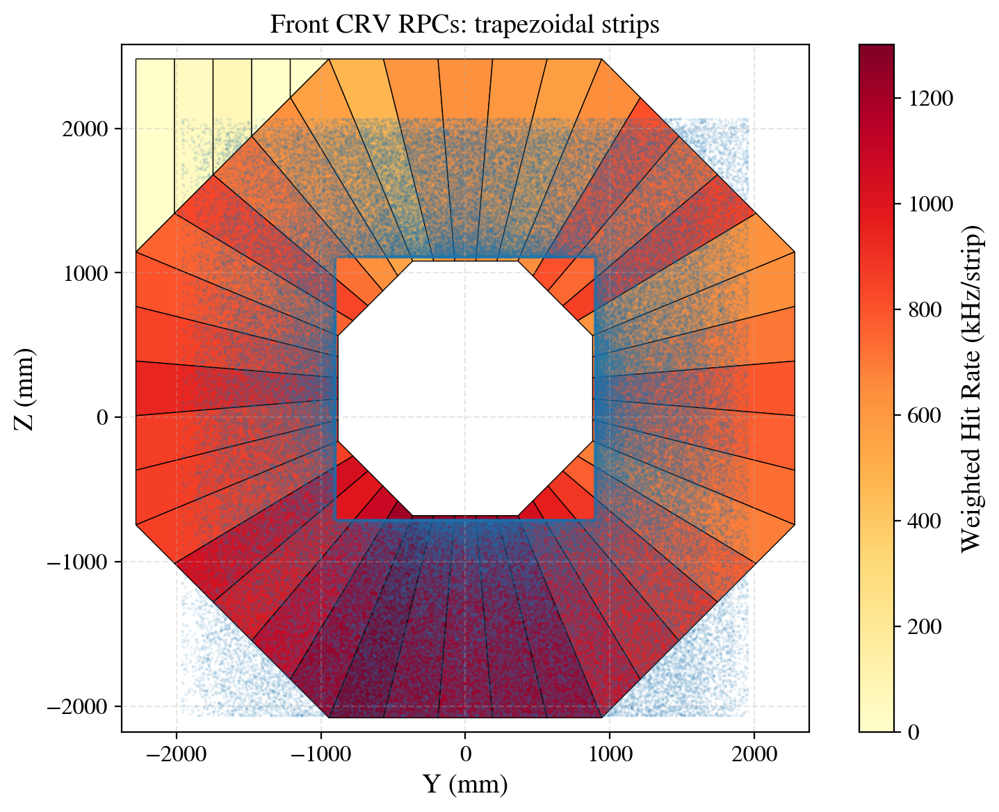

In [400]:
plot_trapezoidal_strip_hitmap(frontcrv4, plotHits=True)